# Проект "Анализ продаж интернет-магазина "Пока все еще тут!"

Материалы:
<https://drive.google.com/file/d/1zbHUGE3meTEf-TtItkvnXOGmiX_VQ62P/view?usp=sharing>

<a id="ogl"></a>
## Оглавление

* [Оглавление](#ogl)
* [Введение](#entry)
* [Загрузка данных и изучение общей информации](#setup)
* [Предобработка данных](#obrabotka)
    * [Изменение типов данных](#obrabotka1)
    * [Проверка на явные и неявные дубликаты](#obrabotka2)
    * [Проверка на аномалии](#obrabotka3)
* [Сегментация данных](#segment)
    * [Категоризация товаров](#segment1)
    * [RFM-анализ](#segment2)
        * [Проверка клиентов, попавших в две группы](#segment3)
* [Исследовательский анализ данных](#analis)
    * [Средний чек](#analis1)
    * [Кумулятивная выручка по категориям](#analis2)
    * [Сезонность товаров](#analis3)
    * [Динамика выручки по месяцам](#analis4)
    * [Диначика средней выручки с покупателями по месяцам](#analis5)
    * [Анализ сегментов покупателей](#analis6)
        * [Количество покупателей в каждой группе](#analis7)
        * [Средний чек](#analis8)
        * [Основные категории](#analis9)
        * [Сезонность товаров для сегментов покупателей](#analis10)
* [Проверка гипотез](#hypot)
    * [Проверка гипотезы о среднем количестве заказов](#hypot1)
    * [Проверка гипотезы о среднем чеке](#hypot2)
* [Заключение](#vivod)

<a id="entry"></a>
## Введение

Интернет-магазину товаров для дома "Пока все еще тут" требуется провести анализ заказов в период с октября 2018 по январь 2020 года. На основе этого анализа будет организована маркетинговая кампания с целью повышения продаж интернет-магазина. Так же для Заказчика будут даны рекомендации по стратегиям увеличения продаж и повышения лояльности клиентов.

<a id="setup"></a>
## Загрузка данных и изучение общей информации

In [1]:
# импорт библиотек
import pandas as pd
import numpy as np
import scipy.stats as stats
import seaborn as sns
import matplotlib.pyplot as plt
import datetime as dt
import plotly.graph_objs as go
import plotly.express as px
from scipy.stats import shapiro
from statsmodels.sandbox.stats.multicomp import multipletests
import warnings
warnings.simplefilter('ignore')

In [2]:
df = pd.read_csv('D:/Datasets/9. Финальный проект/ecom_dataset_upd.csv')
display(df.head(5))

,date,customer_id,order_id,product,quantity,price
0,2018100100,ee47d746-6d2f-4d3c-9622-c31412542920,68477,"Комнатное растение в горшке Алое Вера, d12, h30",1,142.0
1,2018100100,ee47d746-6d2f-4d3c-9622-c31412542920,68477,"Комнатное растение в горшке Кофе Арабика, d12,...",1,194.0
2,2018100100,ee47d746-6d2f-4d3c-9622-c31412542920,68477,Радермахера d-12 см h-20 см,1,112.0
3,2018100100,ee47d746-6d2f-4d3c-9622-c31412542920,68477,Хризолидокарпус Лутесценс d-9 см,1,179.0
4,2018100100,ee47d746-6d2f-4d3c-9622-c31412542920,68477,Циперус Зумула d-12 см h-25 см,1,112.0


In [3]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7474 entries, 0 to 7473
Data columns (total 6 columns):
 #   Column       Non-Null Count  Dtype  
---  ------       --------------  -----  
 0   date         7474 non-null   int64  
 1   customer_id  7474 non-null   object 
 2   order_id     7474 non-null   int64  
 3   product      7474 non-null   object 
 4   quantity     7474 non-null   int64  
 5   price        7474 non-null   float64
dtypes: float64(1), int64(3), object(2)
memory usage: 350.5+ KB


У нас имеется 7474 строк. Как видно, пропущенные значения отсутствуют. Формат данных столбца 'date' необходимо изменить для правильного представления дат.

Представлены следующие данные:
 - 'date' - дата заказа;
 - 'customer_id' - id покупателя;
 - 'order_id' - номер заказа;
 - 'product' - наименование товара;
 - 'quantity' - количество;
 - 'price' - цена за 1 шт.

In [4]:
df.describe()

,date,order_id,quantity,price
count,7.474000e+03,7474.000000,7474.000000,7474.000000
mean,2.018913e+09,49449.884265,2.362858,478.737501
std,4.278878e+05,32679.642404,14.500497,901.615895
min,2.018100e+09,12624.000000,1.000000,9.000000
25%,2.019022e+09,14833.000000,1.000000,97.000000
50%,2.019051e+09,68768.000000,1.000000,135.000000
75%,2.019063e+09,71257.750000,1.000000,439.000000
max,2.020013e+09,112789.000000,1000.000000,14917.000000


Бросается в глаза, что в столбце 'quantity' максимальное значение 1000 шт. Возможно это аномалия, ниже мы это проверим.

<a id="obrabotka"></a>
## Предобработка данных

<a id="obrabotka1"></a>
### Изменение типов данных

In [5]:
# переводим столбцы с датами в нужный формат
df['date'] = pd.to_datetime(df['date'], format='%Y%m%d%H')
df['date'] = df['date'].dt.to_period('D')

<a id="obrabotka2"></a>
### Проверка на явные и неявные дубликаты

In [6]:
# проверяем датафрейм на пропуски и явные дубликаты
print('Количество пропусков:', df.isna().sum().sort_values(ascending=False), 
      'Количество явных дубликатов:', df.duplicated().sum(), sep='\n')

Количество пропусков:
date           0
customer_id    0
order_id       0
product        0
quantity       0
price          0
dtype: int64
Количество явных дубликатов:
966


Найдено 966 дубликатов. Посмотрим их детально.

In [7]:
# выделим в отдельную таблицу дубликаты
repeated_values = df.loc[df.duplicated()]
repeated_values

,date,customer_id,order_id,product,quantity,price
59,2018-10-02,b731df05-98fa-4610-8496-716ec530a02c,68474,Доска гладильная Eurogold Professional 130х48 ...,1,3299.0
60,2018-10-02,b731df05-98fa-4610-8496-716ec530a02c,68474,Доска гладильная Eurogold Professional 130х48 ...,1,3299.0
94,2018-10-04,32de7df8-8d4f-4c84-a7b9-c41d00dd83ba,68522,Эвкалипт Гунни d-17 см h-60 см,1,1409.0
126,2018-10-07,ce0e0c29-8c8b-4714-84bd-80957224d4cf,68557,Сумка-тележка хозяйственная Gimi Market синяя,1,1874.0
147,2018-10-08,3de09660-90bc-4a28-aaf1-34c8435fe59c,68574,"Таз пластмассовый 15,0 л пищевой овальный ""Ekk...",1,209.0
...,...,...,...,...,...,...
6700,2019-10-27,b89ace7f-7017-408c-8755-c4ff39b50980,73104,Циперус Зумула d-12 см h-25 см,2,112.0
6702,2019-10-27,f0fe3add-04d4-4488-8852-7e9e25b95fe9,73101,Хлорофитум d-7 см h-10 см укорененный черенок,2,74.0
6706,2019-10-28,57cc80a2-2610-4eef-9457-e7c3bf0c72f0,70960,Сумка-тележка 2-х колесная Gimi Argo красная,1,1087.0
6711,2019-10-28,cb65d08a-dae7-4890-aef0-bb9f79055e02,73108,Мирт d-9 см h-15 см,1,134.0


In [8]:
# выведем уникальные номера повторяющихся заказов
repeated_values['order_id'].unique()

array([68474, 68522, 68557, 68574, 68668, 14500, 68971, 68996, 69106,
       69118, 69160, 69162, 69218, 69226, 69280, 69303, 69389, 69406,
       69425, 69506, 69520, 69518, 69527, 69598, 69613, 69617, 69628,
       69644, 69586, 69667, 69694, 14521, 69858, 70007, 70115, 70140,
       70200, 70217, 70243, 70286, 14541, 70356, 70412, 70419, 70424,
       70438, 70463, 70505, 70558, 69531, 70620, 70643, 14566, 70697,
       14570, 70721, 70734, 70757, 70769, 70718, 70788, 70818, 70828,
       70856, 70872, 70877, 70862, 14601, 70939, 70953, 70961, 69797,
       71077, 71074, 70962, 71089, 71124, 14649, 14664, 71248, 71247,
       71257, 71341, 71368, 71370, 71390, 14753, 71413, 71400, 71450,
       14795, 71463, 71148, 14833, 14836, 71573, 14835, 71612, 71614,
       71623, 71633, 71638, 71689, 14863, 71733, 14870, 71803, 70960,
       71835, 71918, 14896, 71934, 14897, 71963, 71979, 72011, 72042,
       72124, 72202, 72206, 72274, 72402, 72414, 72443, 72518, 72590,
       72608, 72697,

In [9]:
# посмотрим на несколько таких заказов
df.loc[df['order_id'] == 68474]

,date,customer_id,order_id,product,quantity,price
19,2018-10-01,b731df05-98fa-4610-8496-716ec530a02c,68474,Доска гладильная Eurogold Professional 130х48 ...,1,3299.0
58,2018-10-02,b731df05-98fa-4610-8496-716ec530a02c,68474,Доска гладильная Eurogold Professional 130х48 ...,1,3299.0
59,2018-10-02,b731df05-98fa-4610-8496-716ec530a02c,68474,Доска гладильная Eurogold Professional 130х48 ...,1,3299.0
60,2018-10-02,b731df05-98fa-4610-8496-716ec530a02c,68474,Доска гладильная Eurogold Professional 130х48 ...,1,3299.0
63,2018-10-03,b731df05-98fa-4610-8496-716ec530a02c,68474,Доска гладильная Eurogold Professional 130х48 ...,1,3299.0


In [10]:
df.loc[df['order_id'] == 71257]

,date,customer_id,order_id,product,quantity,price
3147,2019-04-24,15056e00-1aaf-483b-b429-4e9f41ee82b6,71257,Кружка О МИННИ 250 мл H6441 Luminarc Франция,1,239.0
3185,2019-04-26,15056e00-1aaf-483b-b429-4e9f41ee82b6,71257,Кружка О МИННИ 250 мл H6441 Luminarc Франция,1,239.0
3188,2019-04-26,15056e00-1aaf-483b-b429-4e9f41ee82b6,71257,Кружка О МИННИ 250 мл H6441 Luminarc Франция,1,239.0


In [11]:
df.loc[df['order_id'] == 73101]

,date,customer_id,order_id,product,quantity,price
6698,2019-10-27,f0fe3add-04d4-4488-8852-7e9e25b95fe9,73101,Хлорофитум d-7 см h-10 см укорененный черенок,2,74.0
6702,2019-10-27,f0fe3add-04d4-4488-8852-7e9e25b95fe9,73101,Хлорофитум d-7 см h-10 см укорененный черенок,2,74.0


Действительно у нас есть полностью повторяющиеся строки заказов. Но есть еще строки с одинаковыми номерами заказа, которые делались в разные даты, причем с разницей в 1-2 дня. Такие заказы можно удалить.

In [12]:
# удаляем неявные дубликаты с сохранением последнего заказа
df = df.drop_duplicates(subset=['customer_id', 'order_id', 'product'], keep='last')
df

,date,customer_id,order_id,product,quantity,price
0,2018-10-01,ee47d746-6d2f-4d3c-9622-c31412542920,68477,"Комнатное растение в горшке Алое Вера, d12, h30",1,142.0
1,2018-10-01,ee47d746-6d2f-4d3c-9622-c31412542920,68477,"Комнатное растение в горшке Кофе Арабика, d12,...",1,194.0
2,2018-10-01,ee47d746-6d2f-4d3c-9622-c31412542920,68477,Радермахера d-12 см h-20 см,1,112.0
3,2018-10-01,ee47d746-6d2f-4d3c-9622-c31412542920,68477,Хризолидокарпус Лутесценс d-9 см,1,179.0
4,2018-10-01,ee47d746-6d2f-4d3c-9622-c31412542920,68477,Циперус Зумула d-12 см h-25 см,1,112.0
...,...,...,...,...,...,...
7469,2020-01-30,63208953-a8e4-4f77-9b47-3a46e7b72eee,104002,томата (помидор) Черниченский черри № 116 сорт...,2,38.0
7470,2020-01-30,d99d25f1-4017-4fcd-8d29-c580cc695a1a,107336,Дендробиум Санок Анна Грин 1 ствол d-12 см,1,869.0
7471,2020-01-31,2c9bd08d-8c55-4e7a-9bfb-8c56ba42c6d6,106336,Подставка для обуви резиновая Attribute 80x40 ...,1,354.0
7472,2020-01-31,cdd17932-623e-415f-a577-3b31312fd0e2,102002,Тагетис крупноцветковый рассада однолетних цве...,1,128.0


In [13]:
# проверяем датафрейм на пропуски и явные дубликаты
print('Количество пропусков:', df.isna().sum().sort_values(ascending=False), 
      'Количество явных дубликатов:', df.duplicated().sum(), sep='\n')

Количество пропусков:
date           0
customer_id    0
order_id       0
product        0
quantity       0
price          0
dtype: int64
Количество явных дубликатов:
0


In [14]:
# снова проверяем на неявные дубликаты
repeated_values = df.loc[df.duplicated(subset=['customer_id', 'order_id', 'product'])]
repeated_values

,date,customer_id,order_id,product,quantity,price


In [15]:
# проверим есть ли в датасете заказы с одинаковым order_id, но с разными customer_id
same_order_id = df.pivot_table(
    index='order_id', values='customer_id', aggfunc=pd.Series.nunique).reset_index()
same_order_id = same_order_id.loc[same_order_id['customer_id'] > 1]
same_order_id

,order_id,customer_id
248,14872,2
516,68785,2
797,69283,2
817,69310,2
832,69345,2
862,69410,2
902,69485,3
933,69531,2
1066,69833,2
1200,70114,2


In [16]:
# посмотрим на несколько таких заказов
df.loc[df['order_id'] == 68785]

,date,customer_id,order_id,product,quantity,price
512,2018-10-28,0b5ce2c7-acef-4a9a-b821-61a44ed05557,68785,"Сиденье в ванну раздвижное, белый, СВ5, НИКА",1,374.0
538,2018-10-30,c1dd5c0e-51db-4a5d-91a3-5374cb20043d,68785,"Сиденье в ванну раздвижное, белый, СВ5, НИКА",1,374.0


In [17]:
df.loc[df['order_id'] == 71663]

,date,customer_id,order_id,product,quantity,price
5570,2019-06-25,11a9ee7f-c1af-48eb-ab82-bfe5dbc0ab02,71663,Пеларгония розебудная Prins Nikolai укорененны...,1,134.0
6257,2019-09-05,a7ef9c85-57e1-45ad-89c9-8b405339d4c8,71663,Пеларгония розебудная Prins Nikolai укорененны...,1,134.0


In [18]:
repeated_orders = df.loc[df.duplicated(subset=['order_id', 'product'])]
repeated_orders

,date,customer_id,order_id,product,quantity,price
538,2018-10-30,c1dd5c0e-51db-4a5d-91a3-5374cb20043d,68785,"Сиденье в ванну раздвижное, белый, СВ5, НИКА",1,374.0
1160,2018-12-10,e3805ccd-2d64-4d0e-92dd-902293555c35,69283,Сушилка для белья на батарею НИКА СБ6-65 двухъ...,1,164.0
1209,2018-12-15,22e4d79f-3613-4c22-8b01-7f880120bf5a,69345,Сушилка для белья Attribute ПРИМА 18 м синяя A...,1,974.0
1258,2018-12-18,caaa3f41-c9ab-4e3d-8b75-94e1d3a8d7b4,69410,Муляж Желудь 2 шт,3,22.0
1384,2018-12-26,e0461045-4fcc-4731-8837-509f6534512a,69485,Набор столовых приборов 24 предмета FARANDOLE ...,1,1274.0
1583,2019-01-23,a684bf62-f75c-4e82-aa74-6d02b127b439,69833,Чехол Eurogold Clean Metallic металлизированый...,2,299.0
1674,2019-02-03,845d52ce-9420-4c44-b4b5-3fb55c792084,69310,"Муляж Груша желтый 9,5 см полиуретан",7,59.0
1764,2019-02-09,b827d1a8-5e5d-4a44-9813-2bd669471a73,70114,Вешалка-плечики без эссенции цвет тёмно-розовы...,30,40.0
2214,2019-03-06,2273b174-e223-415a-9be1-49d19abea06e,69531,Сумка-тележка хозяйственная Rolser BAB010 rojo...,1,4139.0
2228,2019-03-07,d1bf7700-6afa-4297-9220-48e6aa0d7e2c,70631,Искусственная композиция из цветов пластиковая...,1,74.0


In [19]:
# проверяем, что с помощью функции duplicated мы выделили все необходимые номера заказов
set_repeated_orders = set(list(repeated_orders['order_id']))
set_same_order_id = set(list(same_order_id['order_id']))
                         
if set_repeated_orders == set_same_order_id: 
                         print('Списки содержат одинаковые элементы')
else:
                         print('Списки содержат разные элементы')

Списки содержат одинаковые элементы


In [20]:
# удаляем неявные дубликаты с сохранением последнего заказа
df = df.drop_duplicates(subset=['order_id', 'product'], keep='last')
df

,date,customer_id,order_id,product,quantity,price
0,2018-10-01,ee47d746-6d2f-4d3c-9622-c31412542920,68477,"Комнатное растение в горшке Алое Вера, d12, h30",1,142.0
1,2018-10-01,ee47d746-6d2f-4d3c-9622-c31412542920,68477,"Комнатное растение в горшке Кофе Арабика, d12,...",1,194.0
2,2018-10-01,ee47d746-6d2f-4d3c-9622-c31412542920,68477,Радермахера d-12 см h-20 см,1,112.0
3,2018-10-01,ee47d746-6d2f-4d3c-9622-c31412542920,68477,Хризолидокарпус Лутесценс d-9 см,1,179.0
4,2018-10-01,ee47d746-6d2f-4d3c-9622-c31412542920,68477,Циперус Зумула d-12 см h-25 см,1,112.0
...,...,...,...,...,...,...
7469,2020-01-30,63208953-a8e4-4f77-9b47-3a46e7b72eee,104002,томата (помидор) Черниченский черри № 116 сорт...,2,38.0
7470,2020-01-30,d99d25f1-4017-4fcd-8d29-c580cc695a1a,107336,Дендробиум Санок Анна Грин 1 ствол d-12 см,1,869.0
7471,2020-01-31,2c9bd08d-8c55-4e7a-9bfb-8c56ba42c6d6,106336,Подставка для обуви резиновая Attribute 80x40 ...,1,354.0
7472,2020-01-31,cdd17932-623e-415f-a577-3b31312fd0e2,102002,Тагетис крупноцветковый рассада однолетних цве...,1,128.0


In [21]:
# проверим есть ли в датасете заказы с одинаковым order_id, но с разными customer_id
same_order_id1 = df.pivot_table(
    index='order_id', values='customer_id', aggfunc=pd.Series.nunique).reset_index()
same_order_id1 = same_order_id1.loc[same_order_id1['customer_id'] > 1]
same_order_id1

,order_id,customer_id
902,69485,2


In [22]:
df.loc[df['order_id'] == 69485]

,date,customer_id,order_id,product,quantity,price
1282,2018-12-20,5be0f4b4-947f-4672-b147-73ef5936ecd4,69485,Набор столовых приборов 24 предмета SAINT GERM...,1,1087.0
1384,2018-12-26,e0461045-4fcc-4731-8837-509f6534512a,69485,Набор столовых приборов 24 предмета FARANDOLE ...,1,1274.0


In [23]:
# удаляем один из заказов 69485
df = df.query("index != 1384")

In [24]:
# проверим есть ли в датасете заказы с одинаковым order_id, но с разными customer_id
same_order_id1 = df.pivot_table(
    index='order_id', values='customer_id', aggfunc=pd.Series.nunique).reset_index()
same_order_id1 = same_order_id1.loc[same_order_id1['customer_id'] > 1]
same_order_id1

,order_id,customer_id


In [25]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 5553 entries, 0 to 7473
Data columns (total 6 columns):
 #   Column       Non-Null Count  Dtype    
---  ------       --------------  -----    
 0   date         5553 non-null   period[D]
 1   customer_id  5553 non-null   object   
 2   order_id     5553 non-null   int64    
 3   product      5553 non-null   object   
 4   quantity     5553 non-null   int64    
 5   price        5553 non-null   float64  
dtypes: float64(1), int64(2), object(2), period[D](1)
memory usage: 303.7+ KB


<a id="obrabotka3"></a>
### Проверка на аномалии

In [26]:
df.head(5)

,date,customer_id,order_id,product,quantity,price
0,2018-10-01,ee47d746-6d2f-4d3c-9622-c31412542920,68477,"Комнатное растение в горшке Алое Вера, d12, h30",1,142.0
1,2018-10-01,ee47d746-6d2f-4d3c-9622-c31412542920,68477,"Комнатное растение в горшке Кофе Арабика, d12,...",1,194.0
2,2018-10-01,ee47d746-6d2f-4d3c-9622-c31412542920,68477,Радермахера d-12 см h-20 см,1,112.0
3,2018-10-01,ee47d746-6d2f-4d3c-9622-c31412542920,68477,Хризолидокарпус Лутесценс d-9 см,1,179.0
4,2018-10-01,ee47d746-6d2f-4d3c-9622-c31412542920,68477,Циперус Зумула d-12 см h-25 см,1,112.0


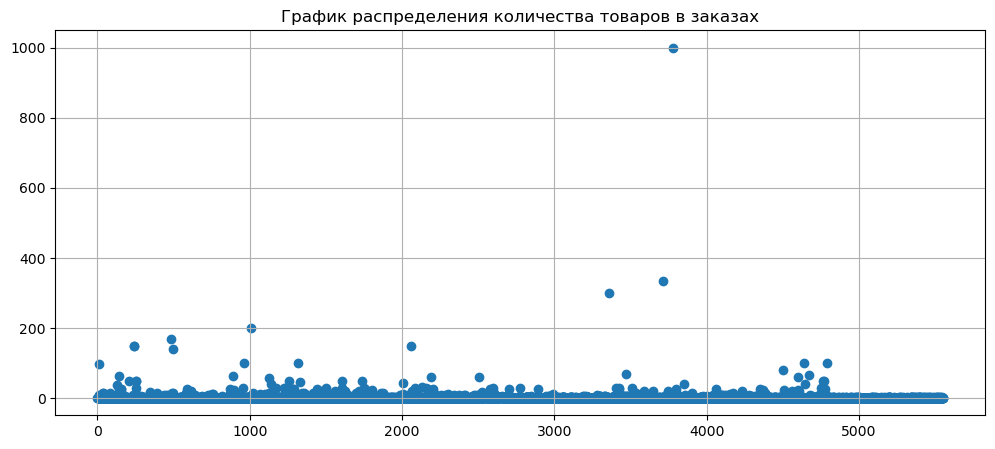

In [27]:
# проверяем как распредяется количество товаров в заказах
x_values = pd.Series(range(0, len(df)))

plt.figure(figsize=(12, 5))
plt.grid(True)
plt.title('График распределения количества товаров в заказах', fontsize=12)
plt.scatter(x_values, df['quantity']);

На графике видим, что в большинстве заказов количество товаров не превышает 100 шт. Но встречаются заказы, где их больше. Необходимо взглянуть на них детальнее.

In [28]:
df['quantity'].describe([0.75, 0.9, 0.95, 0.999])

count    5553.000000
mean        2.586530
std        16.472275
min         1.000000
50%         1.000000
75%         1.000000
90%         3.000000
95%         6.000000
99.9%     150.000000
max      1000.000000
Name: quantity, dtype: float64

In [29]:
quantity_percentile = np.percentile(df['quantity'], 99.9)
quantity_percentile

150.0

In [30]:
# посмотрим на товары, которые заказали более 150 шт.
df.loc[df['quantity'] >= quantity_percentile]

,date,customer_id,order_id,product,quantity,price
266,2018-10-16,cd09ea73-d9ce-48c3-b4c5-018113735e80,68611,"Крепеж для пружины дверной, 1107055",150,19.0
267,2018-10-16,cd09ea73-d9ce-48c3-b4c5-018113735e80,68611,Пружина дверная 240 мм оцинкованная (Д-19 мм) ...,150,38.0
568,2018-11-01,aa42dc38-780f-4b50-9a65-83b6fa64e766,68815,Муляж ЯБЛОКО 9 см красное,170,51.0
1158,2018-12-10,a984c5b7-ff7e-4647-b84e-ef0b85a2762d,69289,"Ручка-скоба РС-100 белая *Трибатрон*, 1108035",200,29.0
2431,2019-03-23,685d3d84-aebb-485b-8e59-344b3df8b3d3,70841,Плечики пластмассовые Размер 52 - 54 Тула 1205158,150,20.0
3961,2019-05-20,5d189e88-d4d6-4eac-ab43-fa65a3c4d106,71478,Муляж ЯБЛОКО 9 см красное,300,51.0
5071,2019-06-11,146cd9bf-a95c-4afb-915b-5f6684b17444,71668,Вешалки мягкие для деликатных вещей 3 шт шоколад,334,148.0
5456,2019-06-18,312e9a3e-5fca-43ff-a6a1-892d2b2d5ba6,71743,"Вантуз с деревянной ручкой d14 см красный, Bur...",1000,675.0


Все строчки выглядят довольно логично, кроме заказа 1000 вантузов. Будем считать это аномалией.

In [31]:
# задаем перцентиль, который отсечет аномальный заказ
quantity_percentile = np.percentile(df['quantity'], 99.999999999999999)
quantity_percentile

1000.0

In [32]:
# отсекаем аномальные данные
df = df.query("quantity < @quantity_percentile")

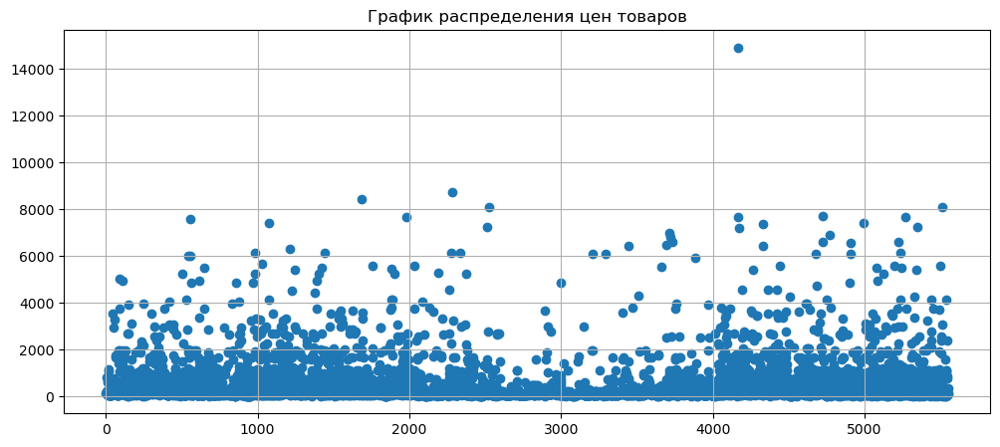

In [33]:
# проверяем как распределяются цены за 1 шт. в датасете
x_values = pd.Series(range(0, len(df)))

plt.figure(figsize=(12, 5))
plt.grid(True)
plt.title('График распределения цен товаров', fontsize=12)
plt.scatter(x_values, df['price']);

На графике видим, что выделяется по цене одна позиция. Посмотрим подробнее.

In [34]:
price_percentile = np.percentile(df['price'], 99.99)
price_percentile

11486.481999996951

In [35]:
# посмотрим на товары с высокой ценой
df.loc[df['price'] >= price_percentile]

,date,customer_id,order_id,product,quantity,price
5992,2019-07-29,0d87f4ae-465a-4fac-81e6-5d629761783e,72139,Сушилка уличная Leifheit 85210 LINOMATIC V 400...,1,14917.0


Данная сушилка действительно может так стоить. Аналогичная сушилка в 2025 г. стоит ≈ 30 000 руб.

In [36]:
# посчитаем выручку в отдельном столбце
df['revenue'] = df['quantity'] * df['price'].round()

In [37]:
# сводная таблица со стоимостью каждого заказа
grouped_receipt = df.groupby(['order_id']).agg({'revenue': 'sum'}).reset_index()
grouped_receipt.columns = ['order_id', 'total_revenue']
grouped_receipt.sort_values(by='total_revenue', ascending=False) 

,order_id,total_revenue
2008,71668,49432.0
1065,69830,47385.0
722,69156,33680.0
917,69504,32718.0
569,68878,24370.0
...,...,...
3056,105745,10.0
3436,111690,10.0
3104,106536,10.0
3166,107324,10.0


In [38]:
# добавляем к таблице df данные таблицы grouped_receipt по order_id
df = df.merge(grouped_receipt, on=['order_id'], how='left')
df

,date,customer_id,order_id,product,quantity,price,revenue,total_revenue
0,2018-10-01,ee47d746-6d2f-4d3c-9622-c31412542920,68477,"Комнатное растение в горшке Алое Вера, d12, h30",1,142.0,142.0,1037.0
1,2018-10-01,ee47d746-6d2f-4d3c-9622-c31412542920,68477,"Комнатное растение в горшке Кофе Арабика, d12,...",1,194.0,194.0,1037.0
2,2018-10-01,ee47d746-6d2f-4d3c-9622-c31412542920,68477,Радермахера d-12 см h-20 см,1,112.0,112.0,1037.0
3,2018-10-01,ee47d746-6d2f-4d3c-9622-c31412542920,68477,Хризолидокарпус Лутесценс d-9 см,1,179.0,179.0,1037.0
4,2018-10-01,ee47d746-6d2f-4d3c-9622-c31412542920,68477,Циперус Зумула d-12 см h-25 см,1,112.0,112.0,1037.0
...,...,...,...,...,...,...,...,...
5547,2020-01-30,63208953-a8e4-4f77-9b47-3a46e7b72eee,104002,томата (помидор) Черниченский черри № 116 сорт...,2,38.0,76.0,76.0
5548,2020-01-30,d99d25f1-4017-4fcd-8d29-c580cc695a1a,107336,Дендробиум Санок Анна Грин 1 ствол d-12 см,1,869.0,869.0,869.0
5549,2020-01-31,2c9bd08d-8c55-4e7a-9bfb-8c56ba42c6d6,106336,Подставка для обуви резиновая Attribute 80x40 ...,1,354.0,354.0,354.0
5550,2020-01-31,cdd17932-623e-415f-a577-3b31312fd0e2,102002,Тагетис крупноцветковый рассада однолетних цве...,1,128.0,128.0,128.0


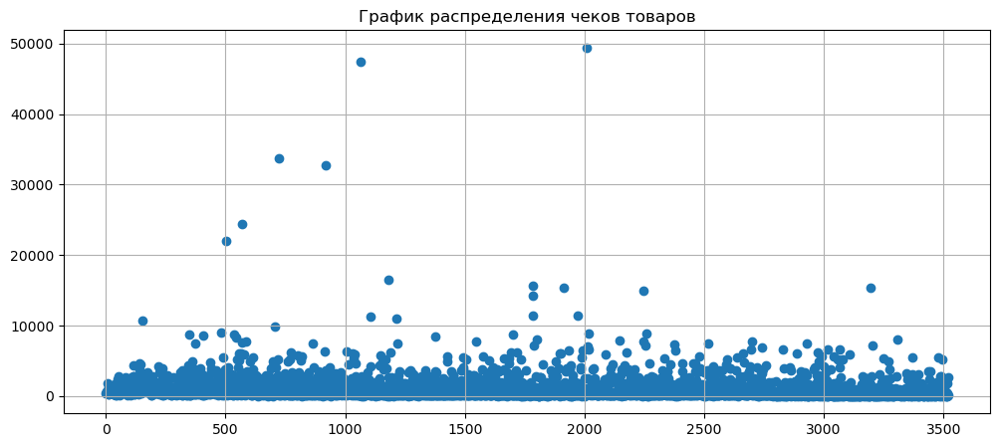

In [39]:
# проверяем как распределяется стоимость одного чека
x_values = pd.Series(range(0, len(grouped_receipt)))

plt.figure(figsize=(12, 5))
plt.grid(True)
plt.title('График распределения чеков товаров', fontsize=12)
plt.scatter(x_values, grouped_receipt['total_revenue']);

Есть чеки с высокой стоимостью. Посмотрим их подробнее.

In [40]:
receipt_percentile = np.percentile(grouped_receipt['total_revenue'], 99.6)
receipt_percentile

11230.999999999995

In [41]:
# посмотрим на дорогие чеки
df.loc[df['revenue'] > receipt_percentile]

,date,customer_id,order_id,product,quantity,price,revenue,total_revenue
561,2018-11-06,1b2764ad-9151-4051-a46a-9b01b62e6335,68878,"Урна уличная ""Гео"", Hobbyka/Хоббика, 59*37,5см...",5,4874.0,24370.0,24370.0
893,2018-11-29,8fba3604-ef57-4b9f-b2fe-3402fa8825c8,69156,Набор ножей Attribute CHEF 5 предметов AKF522,64,457.0,29248.0,33680.0
1127,2018-12-21,6987e6d6-a63a-4ce2-a2d0-f424092d235e,69504,Тележка багажная DELTA ТБР-22 синий грузоподъе...,57,574.0,32718.0,32718.0
1287,2019-01-15,58a4c3cc-504f-43ea-a74a-bae19e665552,69830,Простынь вафельная 200х180 см WELLNESS RW180-0...,27,1755.0,47385.0,47385.0
1328,2019-01-22,6be74251-7159-4cc0-99fb-d034a17c61b0,69928,Спатифиллум Шопен d-12 см,45,250.0,11250.0,11250.0
1421,2019-02-04,909564b8-3a5c-4d3e-8310-5ba1c837bbd7,70080,Мусорный контейнер Hailo BigBin Swing 45 0845-...,3,5512.0,16536.0,16536.0
2508,2019-04-19,498f12a4-6a62-4725-8516-cf5dc9ab8a3a,71204,Салфетка Protec Textil Polyline 30х43 см Амети...,60,191.0,11460.0,11460.0
2509,2019-04-19,498f12a4-6a62-4725-8516-cf5dc9ab8a3a,71205,Наматрацник Natures Бархатный бамбук ББ-Н-1-2 ...,12,1183.0,14196.0,14196.0
2510,2019-04-19,498f12a4-6a62-4725-8516-cf5dc9ab8a3a,71206,Одеяло Wellness T142 белое темостеганое 140х20...,10,1568.0,15680.0,15680.0
3360,2019-05-20,5d189e88-d4d6-4eac-ab43-fa65a3c4d106,71478,Муляж ЯБЛОКО 9 см красное,300,51.0,15300.0,15300.0


Я думаю эти заказы не являются аномалиями.

Вывод:

Проведена предобработка данных: изменение типа данных столбца 'date', выявлены и удалены явные и неявные дубликаты, проведен анализ аномалий в датасете.

In [42]:
# сводная таблица покупателей с количеством заказов больше 1
grouped_customer_id = df.pivot_table(
    index='customer_id', values='order_id', aggfunc=pd.Series.nunique).reset_index()
grouped_customer_id = grouped_customer_id.loc[grouped_customer_id['order_id'] > 1]
grouped_customer_id.sort_values(by='order_id', ascending=False) 

,customer_id,order_id
1899,c971fb21-d54c-4134-938f-16b62ee86d3b,126
735,4d93d3f6-8b24-403b-a74b-f5173e40d7db,35
1088,73d1cd35-5e5f-4629-8cf2-3fda829d4e58,17
1731,b7b865ab-0735-407f-8d0c-31f74d2806cc,7
17,0184f535-b60a-4914-a982-231e3f615206,5
...,...,...
839,59d27596-07b8-4784-9401-56c079e29826,2
840,59d715ca-dcd8-4404-a765-78e2a36f26ce,2
841,59d8ae65-2cac-4d55-9bd5-12d9780aab99,2
843,5a15bd5f-ecf4-496f-913c-23d6f76a2f8d,2


In [43]:
df.loc[df['customer_id'] == 'c971fb21-d54c-4134-938f-16b62ee86d3b']

,date,customer_id,order_id,product,quantity,price,revenue,total_revenue
9,2018-10-01,c971fb21-d54c-4134-938f-16b62ee86d3b,68480,Чехол для гладильной доски Colombo Persia Beig...,1,674.0,674.0,674.0
15,2018-10-02,c971fb21-d54c-4134-938f-16b62ee86d3b,68490,Чехол для гладильной доски Festival 137x60 см ...,1,1162.0,1162.0,1162.0
56,2018-10-03,c971fb21-d54c-4134-938f-16b62ee86d3b,68511,Набор прищепок большие пластиковые ROZENBAL ПИ...,10,86.0,860.0,860.0
57,2018-10-03,c971fb21-d54c-4134-938f-16b62ee86d3b,68514,Сушилка для белья Attribute ПРИМА 11 м синяя н...,1,749.0,749.0,749.0
117,2018-10-08,c971fb21-d54c-4134-938f-16b62ee86d3b,68561,Тележка багажная DELTA ТБР-20 коричневый с ора...,1,742.0,742.0,742.0
...,...,...,...,...,...,...,...,...
1852,2019-03-04,c971fb21-d54c-4134-938f-16b62ee86d3b,70582,Нефролепис Бостон d-12 см,1,292.0,292.0,292.0
1854,2019-03-04,c971fb21-d54c-4134-938f-16b62ee86d3b,70589,Калла крупноцветковая желтая,1,374.0,374.0,374.0
1870,2019-03-05,c971fb21-d54c-4134-938f-16b62ee86d3b,70606,Пеларгония розебудная Red Pandora укорененный ...,1,134.0,134.0,134.0
1874,2019-03-05,c971fb21-d54c-4134-938f-16b62ee86d3b,70614,Гладильная доска НИКА LORA FASHION HLF 123х46 см,1,1949.0,1949.0,1949.0


<a id="segment"></a>
## Сегментация данных

<a id="segment1"></a>
### Категоризация товаров

In [44]:
# установим опцию, позволяющую вывести все строки
pd.set_option('display.max_rows', None)

In [45]:
# выводим все товары колонки 'product'
df['product']

0         Комнатное растение в горшке Алое Вера, d12, h30
1       Комнатное растение в горшке Кофе Арабика, d12,...
2                             Радермахера d-12 см h-20 см
3                        Хризолидокарпус Лутесценс d-9 см
4                          Циперус Зумула d-12 см h-25 см
5                                 Шеффлера Лузеана d-9 см
6                        Юкка нитчатая d-12 см h-25-35 см
7         Настенная сушилка для белья Gimi Brio Super 100
8       Таз пластмассовый 21,0 л круглый "Водолей" С61...
9       Чехол для гладильной доски Colombo Persia Beig...
10      Вешалка для брюк металлическая с резиновым пок...
11      Сушилка для белья потолочная Zalger Lift Basic...
12      Чехол Eurogold Clean Basic хлопок для досок 12...
13      Крючок одежный 2-х рожковый серый металлик с п...
14      Корзина мягкая пластиковая 17 л, М-пластика, M...
15      Чехол для гладильной доски Festival 137x60 см ...
16             Сумка-тележка 2-х колесная Gimi Argo синяя
17      Многол

In [46]:
len(df['product'])

5552

У нас получилось 5540 товаров, но среди них есть дубликаты.

In [47]:
# удалим дубликаты в колонке 'product'
product = df.loc[df.duplicated(subset=['product'])]
product

,date,customer_id,order_id,product,quantity,price,revenue,total_revenue
68,2018-10-04,e64aad3a-fffc-4193-8df5-e94a43eff295,68521,"Комнатное растение в горшке Кофе Арабика, d12,...",1,194.000000,194.0,567.0
71,2018-10-04,e64aad3a-fffc-4193-8df5-e94a43eff295,68521,Подкладка под чехол Zalger 520140 135х50 см по...,1,127.000000,127.0,567.0
76,2018-10-04,e8a27cb1-6d5a-4161-aac4-11df7dfb4a0e,68523,"Муляж ГРАНАТ 9см, красный, Fancy Fair, SL90, к...",4,59.000000,236.0,4379.0
78,2018-10-04,e8a27cb1-6d5a-4161-aac4-11df7dfb4a0e,68523,"Муляж Груша, желтый, 9,5 см, полиуретан, Fancy...",2,59.000000,118.0,4379.0
79,2018-10-04,e8a27cb1-6d5a-4161-aac4-11df7dfb4a0e,68523,"Муляж Мандарин, оранжевый, 8 см, полиуретан, F...",6,52.000000,312.0,4379.0
83,2018-10-04,35fecc88-69a5-49d2-bedf-1f1020f82829,68524,Сумка для тележки большая комбинированная 45*3...,1,374.000000,374.0,374.0
99,2018-10-05,552e17df-ba16-4e66-84fb-55a5557a6bea,68544,"Вилка столовая RIPPLE сталь 3 мм, 3 шт, Attrib...",3,187.000000,561.0,2453.0
100,2018-10-05,552e17df-ba16-4e66-84fb-55a5557a6bea,68544,"Ложка столовая RIPPLE сталь 3 мм, 3 шт, Attrib...",4,202.000000,808.0,2453.0
101,2018-10-05,552e17df-ba16-4e66-84fb-55a5557a6bea,68544,"Ложка чайная RIPPLE сталь 2,5 мм, 3 шт, Attrib...",4,142.000000,568.0,2453.0
102,2018-10-05,552e17df-ba16-4e66-84fb-55a5557a6bea,68544,"Нож столовый RIPPLE 80 г 2 шт, Attribute, ACR042",3,172.000000,516.0,2453.0


В итоге получилось 3211 уникальных товаров

In [48]:
# сбросим опцию вывода все строк
pd.reset_option('display.max_rows')

In [49]:
# создаем списки товаров с ключевыми словами
decor = ['муляж', 'цветок искусственный', 'искусственный цветок', 'искусственная', 'искуственных цветов', 'stockholm'] 

plants = ['растение', 'рассада', 'd-13 см', 'герань', 'пеларгония', 'd-12 см', 'd-10 см', 'd-21 см', 'd-9 см', 'd-7 см', 
          'калибрахоа', 'D12', 'бакопа', 'томата', 'd-17 см', '80 см', 'петуния', 'дыня', 'арбуз', 'фуксия', 'd-20 см',           '0,5 л', 'ампельная', 'd-15 см', 'садовая', 'комнатная', 'флокс', 'хризантема', 'бегония', 'кашпо', 'вербейник', 
          'виноград', 'вербена', 'камнеломка', 'ромашка', 'антуриум', 'алиссум', 'капуста', 'лавр', 'огурец', 'сельдерей', 
          'd-5 см', 'цикламен', 'базилик', 'укроп', 'd-23 см', 'd-14 см', 'настурция', 'петрушка', '0,1 г', 'кипарисовик', 
          'клубника', 'змееголовник', 'гвоздика', 'клен', 'd-12', 'бахромчатый', 'тюльпаны', 'календула', 'зверобой', 
          'гиностемма', 'космея', 'гортензия', 'бархатцы', 'цинния', 'ранункулус', 'ель', 'вербена', 'декабрист', 'пуансеттия',
          'фиалка', 'кориандр', 'морковь', 'лапчатка', 'эшшольция', 'скиммия', 'кодонанта', 'горох', 'земляника', 'кустовая', 
          'одноголовая', 'государь', 'детерминантный', 'дендробиум', 'калла', 'георгина', 'смолевка', 'матиолла', 'хоста', 
          'гайлардия', 'рудбекия', 'осина', 'лаватера', 'валериана', 'любисток', 'цинерария', 'шалфей', 'вигна', 'рукола',
          'котовник', 'ампельная', 'аквилегия', 'седум', 'липейник', 'овсянница', 'лилейник', 'папоротник', 'энотера',
          'пиретрум', 'кореопсис', 'вероника', 'монарда', 'астра', 'солидаго', 'бадан', 'чайно-гибридная']

housewares = ['сушилка', 'таз', 'чехол', 'стяжка', 'ковёр', 'кофр', 'подрукавник', 'плетеный', 'подушка', 'пробки', 'тряпка',
              'вешалка', 'доска', 'коврик', 'латексные', 'плечики', 'швабра', 'щетка', 'подставка', 'шнур', 'термометр', 
              'бензин', 'простынь', 'стремянка', 'корзина', 'веник', 'крепеж', 'салфет', 'корыто', 'штанга', 'дозатор', 'ковш', 
              'средство', 'этажерка', 'тряпкодержатель', 'окномойка', 'карниз', 'стремянки', 'полки', 'вешалки', 'петля', 
              'ведро', 'весы', 'комод', 'рукав', 'стакан для ванной', 'стеллаж', 'сварка', 'покрытие', 'линейка', 
              'костюма', 'пакет', 'зажигалка', 'вешалок', 'полотенце', 'прищепки', 'совок', 'покрывало', 'стяжки', 'шпингалет'
              'подголовник', 'сетка', 'гель', 'ключница', 'одеяло', 'ковер', 'постель', 'кольца', 'скоба', 'решетка',
              'clean', 'почтовый', 'штангенциркуль', 'крючок', 'бак', 'мытья', 'ведра', 'капроновый', 'туалета', 'мешок',
              'наматрасник', 'пена', 'сверел', 'сверло', 'насадка', 'урна', 'чайный', 'сметка', 'фен', 'рукояткой',
              'ролик', 'ролика', 'шило', 'мыльница', 'инструмент', 'фоторамка', 'плед', 'пылесос', 'полотенец', 'утюг', 
              'напильников', 'полки', 'ткань', 'наматрацник', 'фиксатор', 'наволочка', 'клипсами', 'обувница', 'пододеяльник', 
              'антинакипин', 'шпагат', 'пуф', 'ванна', 'корзинка', 'простыня', 'ковров', 'чистящий крем', 'пружина', 'сито',
              'светильник', 'веревка', 'hausmann', 'для обуви', 'с пружиной', 'для гладильной доски']

kitchen = ['ripple', 'кувшин', 'контейнер', 'салфетка', 'стакан', 'салатник', 'тарелка', 'банка', 'чайник', 'столовых', 
           'измельчитель', 'кастрюля', 'термокружка', 'avex', 'миксер', 'хлебница', 'сковорода', 'блюдце', 'ведро', 'миска', 
           'нож', 'овощеварка', 'терка', 'скатерть', 'крышка', 'блюдо', 'сахарница', 'просеиватель', 'термос', 'ложка', 
           'отделитель', 'вкладыши', 'кексов', 'прищепок', 'коробка', 'соковыжималка', 'кружка', 'толкушка', 'масленка', 
           'лоток', 'textilebox', 'кружка', 'сотейник', 'орехоколка', 'выпечки', 'котел', 'для пива', 'фужеров', 'противень', 
           'вилка', 'лопатка', 'овощечистка', 'губка', 'антижир', 'полотенец', 'мантоварка', 'бокалов', 'кондитерский', 
           'картофелемялка', 'чеснока', 'электроштопор', 'бульонница', 'емкость', 'посудомоечных', 'luminarc', 'скалка', 
           'венчик', 'сито', 'тортница', 'посуды', 'бидон', 'соковарка', 'рыбочистка', 'половник', 'кипятильник', 'fabrikators'
           'пластиковый', 'василиса']

bathroom = ['штора', 'ванну', 'стиральной', 'ёрш', 'резиновые', 'для ванной', 'для белья', 'противоскользящий', 'паста', 
            'для унитаза', 'мыло', 'халат', 'вантуз', 'подголовник', 'для ванны', 'маска', 'перчатки']

bag = ['сумка', 'тележка']

In [50]:
# приведем в новом столбце наименование товаров к нижнему регистру
df['product_categ'] = df['product'].str.lower() 

In [51]:
# создаем функцию, которая будет проходиться по нашим спискам с категориями и возвращать соответствующую категорию
def classify_product(product):
    for item in decor:
        if item in product:
            return 'Искусственные цветы, декор, подарки'
    for item in plants:
        if item in product:
            return 'Растения и рассада'   
    for item in housewares:
        if item in product:
            return 'Товары для дома'  
    for item in kitchen:
        if item in product:
            return 'Товары для кухни'
    for item in bathroom:
        if item in product:
            return 'Товары для ванны' 
    for item in bag:
        if item in product:
            return 'Сумки и тележки'        
    return 'Нет данных о категории'

In [52]:
# добавляем результат функции classify_product в столбец 'product_categ'
df['product_categ'] = df['product_categ'].apply(classify_product)

In [53]:
# проверяем остались ли строки где нет категории
len(df.query('product_categ == "Нет данных о категории"'))

0

Все товары распределены по следующим категориям:
 - 'Искусственные цветы, декор, подарки'
 - 'Растения и рассада'   
 - 'Товары для дома'  
 - 'Товары для кухни'
 - 'Товары для ванны'
 - 'Сумки и тележки'

<a id="segment2"></a>
### RFM-анализ

In [54]:
# задаем конечную дату анализа
now = df['date'].max()

# сводная таблица для rfm-анализа
rfm_table=(
    df.groupby('customer_id')
    .agg({'date': lambda x: pd.to_timedelta(now - x.max()).days, # Recency
          'order_id': lambda x: len(x.unique()), # Frequency
          'revenue': lambda x: x.sum()})
    .reset_index())    # Monetary 

# переименовываем столбцы
rfm_table.rename(columns={'date': 'recency', 
                         'order_id': 'frequency',
                         'revenue': 'monetary_value'}, inplace=True)

rfm_table

,customer_id,recency,frequency,monetary_value
0,000d6849-084e-4d9f-ac03-37174eaf60c4,107,1,555.0
1,001cee7f-0b29-4716-b202-0042213ab038,349,1,442.0
2,00299f34-5385-4d13-9aea-c80b81658e1b,109,1,914.0
3,002d4d3a-4a59-406b-86ec-c3314357e498,369,1,1649.0
4,003bbd39-0000-41ff-b7f9-2ddaec152037,124,1,2324.0
...,...,...,...,...
2423,ff601403-b094-4b86-9ac6-264d725b9277,12,2,1739.0
2424,ffaeab76-3a8d-49ee-860f-17273b2fc8a2,92,1,397.0
2425,ffb5976a-7a4d-460b-95c4-5ffaba31cb24,412,1,389.0
2426,ffb80538-3fda-4351-8ea9-9d2bec58bb07,144,1,974.0


In [55]:
# задаем конечную дату анализа
now = df['date'].max()

# сводная таблица для rfm-анализа
rfm_table1=(
    df.groupby('customer_id')
    .agg({'date': lambda x: pd.to_timedelta(now - x.max()).days, # Recency
          'order_id': lambda x: len(x.unique()), # Frequency
          'revenue': lambda x: x.sum()})
)    # Monetary 

# переименовываем столбцы
rfm_table1.rename(columns={'date': 'recency', 
                         'order_id': 'frequency',
                         'revenue': 'monetary_value'}, inplace=True)

rfm_table1

,recency,frequency,monetary_value
customer_id,,,
000d6849-084e-4d9f-ac03-37174eaf60c4,107,1,555.0
001cee7f-0b29-4716-b202-0042213ab038,349,1,442.0
00299f34-5385-4d13-9aea-c80b81658e1b,109,1,914.0
002d4d3a-4a59-406b-86ec-c3314357e498,369,1,1649.0
003bbd39-0000-41ff-b7f9-2ddaec152037,124,1,2324.0
...,...,...,...
ff601403-b094-4b86-9ac6-264d725b9277,12,2,1739.0
ffaeab76-3a8d-49ee-860f-17273b2fc8a2,92,1,397.0
ffb5976a-7a4d-460b-95c4-5ffaba31cb24,412,1,389.0


In [56]:
# высчитываем квантили 25 и 75
quantiles = rfm_table1.quantile(q=[0.25,0.75])
quantiles

,recency,frequency,monetary_value
0.25,73.0,1.0,394.5
0.75,344.0,2.0,1798.0


In [57]:
# переводим квантили в словарь.
quantiles = quantiles.to_dict()

In [58]:
##  rfm-сегментация
rfm_segment = rfm_table.copy()
# функция распределит клиентов по группам в зависимости от значений recency, frequency, monetary_value
# аргументы (x = значение, p = recency, d = словарь квантиля)
def r_class(x,p,d):
    if x <= d[p][0.25]:
        return 3
    elif x <= d[p][0.75]: 
        return 2
    else:
        return 1
    
# аргументы (x = значение, p = monetary_value, frequency, d = словарь квантиля)
def fm_class(x,p,d):
    if x <= d[p][0.25]:
        return 1
    elif x <= d[p][0.75]: 
        return 2
    else:
        return 3
    
rfm_segment['r_quartile'] = rfm_segment['recency'].apply(r_class, args=('recency',quantiles,))
rfm_segment['f_quartile'] = rfm_segment['frequency'].apply(fm_class, args=('frequency',quantiles,))
rfm_segment['m_quartile'] = rfm_segment['monetary_value'].apply(fm_class, args=('monetary_value',quantiles,))
rfm_segment['rfm_class'] = rfm_segment.r_quartile.map(str) \
                            + rfm_segment.f_quartile.map(str) \
                            + rfm_segment.m_quartile.map(str)

In [59]:
rfm_segment

,customer_id,recency,frequency,monetary_value,r_quartile,f_quartile,m_quartile,rfm_class
0,000d6849-084e-4d9f-ac03-37174eaf60c4,107,1,555.0,2,1,2,212
1,001cee7f-0b29-4716-b202-0042213ab038,349,1,442.0,1,1,2,112
2,00299f34-5385-4d13-9aea-c80b81658e1b,109,1,914.0,2,1,2,212
3,002d4d3a-4a59-406b-86ec-c3314357e498,369,1,1649.0,1,1,2,112
4,003bbd39-0000-41ff-b7f9-2ddaec152037,124,1,2324.0,2,1,3,213
...,...,...,...,...,...,...,...,...
2423,ff601403-b094-4b86-9ac6-264d725b9277,12,2,1739.0,3,2,2,322
2424,ffaeab76-3a8d-49ee-860f-17273b2fc8a2,92,1,397.0,2,1,2,212
2425,ffb5976a-7a4d-460b-95c4-5ffaba31cb24,412,1,389.0,1,1,1,111
2426,ffb80538-3fda-4351-8ea9-9d2bec58bb07,144,1,974.0,2,1,2,212


In [60]:
df = df.merge(rfm_segment[['customer_id', 'rfm_class']], on=['customer_id'], how='left')
df

,date,customer_id,order_id,product,quantity,price,revenue,total_revenue,product_categ,rfm_class
0,2018-10-01,ee47d746-6d2f-4d3c-9622-c31412542920,68477,"Комнатное растение в горшке Алое Вера, d12, h30",1,142.0,142.0,1037.0,Растения и рассада,112
1,2018-10-01,ee47d746-6d2f-4d3c-9622-c31412542920,68477,"Комнатное растение в горшке Кофе Арабика, d12,...",1,194.0,194.0,1037.0,Растения и рассада,112
2,2018-10-01,ee47d746-6d2f-4d3c-9622-c31412542920,68477,Радермахера d-12 см h-20 см,1,112.0,112.0,1037.0,Растения и рассада,112
3,2018-10-01,ee47d746-6d2f-4d3c-9622-c31412542920,68477,Хризолидокарпус Лутесценс d-9 см,1,179.0,179.0,1037.0,Растения и рассада,112
4,2018-10-01,ee47d746-6d2f-4d3c-9622-c31412542920,68477,Циперус Зумула d-12 см h-25 см,1,112.0,112.0,1037.0,Растения и рассада,112
...,...,...,...,...,...,...,...,...,...,...
5547,2020-01-30,63208953-a8e4-4f77-9b47-3a46e7b72eee,104002,томата (помидор) Черниченский черри № 116 сорт...,2,38.0,76.0,76.0,Растения и рассада,322
5548,2020-01-30,d99d25f1-4017-4fcd-8d29-c580cc695a1a,107336,Дендробиум Санок Анна Грин 1 ствол d-12 см,1,869.0,869.0,869.0,Растения и рассада,323
5549,2020-01-31,2c9bd08d-8c55-4e7a-9bfb-8c56ba42c6d6,106336,Подставка для обуви резиновая Attribute 80x40 ...,1,354.0,354.0,354.0,Товары для дома,322
5550,2020-01-31,cdd17932-623e-415f-a577-3b31312fd0e2,102002,Тагетис крупноцветковый рассада однолетних цве...,1,128.0,128.0,128.0,Растения и рассада,322


In [61]:
# мы получили необходимые группы
df['rfm_class'].unique()

array(['112', '221', '233', '222', '133', '113', '111', '223', '122',
       '123', '121', '321', '322', '323', '132', '212', '213', '211',
       '232', '231', '313', '311', '312'], dtype=object)

In [62]:
# создадим функцию, которая распределит клиентов по группам 
# group1 – где первая цифра 1;
# group2 – где первая цифра 2;
# group3 – где первая цифра 3.
def categorize_rfm(rfm):
    try:
        if rfm == '112' or rfm == '122' or rfm == '132' or rfm == '131' or rfm == '113' or rfm == '121' or rfm == '133' \
        or rfm == '123' or rfm == '111':
             return 'Ушедшие клиенты'
        elif rfm == '233' or rfm == '212' or rfm == '211' or rfm == '223' or rfm == '222' or rfm == '213' or rfm == '231' \
        or rfm == '221' or rfm == '232':
            return 'Неактивные клиенты'
        elif rfm == '313' or rfm == '321' or rfm == '312' or rfm == '322' or rfm == '311' or rfm == '323' or rfm == '332' \
        or rfm == '331' or rfm == '333':
            return 'Постоянные клиенты'
    except:
        pass

In [63]:
# добавляем результат функции categorize_rfm в столбец 'rfm_group'
df['rfm_group'] = df['rfm_class'].apply(categorize_rfm)

In [64]:
# проверяем, что все верно
df['rfm_group'].unique()

array(['Ушедшие клиенты', 'Неактивные клиенты', 'Постоянные клиенты'],
      dtype=object)

<a id="segment3"></a>
#### Проверка клиентов, попавших в две группы

In [65]:
# сформируем отдельные таблицы для каждой категории пользователя
users_rfm1 = df[df['rfm_group']=='Ушедшие клиенты']['customer_id']
users_rfm2 = df[df['rfm_group']=='Неактивные клиенты']['customer_id']
users_rfm3 = df[df['rfm_group']=='Постоянные клиенты']['customer_id']

# проверяем какие клиенты попали в группу 1 и 2
users_rfm_12 = df.loc[df['customer_id'].isin(users_rfm1) & 
                                 df['customer_id'].isin(users_rfm2),'customer_id'].unique()
users_rfm_12

array([], dtype=object)

In [66]:
# проверяем какие клиенты попали в группу 2 и 3
users_rfm_23 = df.loc[df['customer_id'].isin(users_rfm2) & 
                                 df['customer_id'].isin(users_rfm3),'customer_id'].unique()
users_rfm_23

array([], dtype=object)

In [67]:
# проверяем какие клиенты попали в группу 1 и 3
users_rfm_13 = df.loc[df['customer_id'].isin(users_rfm1) & 
                                 df['customer_id'].isin(users_rfm3),'customer_id'].unique()
users_rfm_13

array([], dtype=object)

In [68]:
# проверяем какие клиенты попали в группы 1, 2 и 3
users_rfm_123 = df.loc[df['customer_id'].isin(users_rfm1) & 
                                 df['customer_id'].isin(users_rfm2) & 
                                 df['customer_id'].isin(users_rfm3),'customer_id'].unique()
users_rfm_123

array([], dtype=object)

Пользователей, вошедших в 2 и более групп, не найдено.

In [69]:
df['customer_id'].nunique()

2428

In [70]:
print(
    'Размер группы "Ушедшие клиенты":', 
    df.loc[df['rfm_group'] == 'Ушедшие клиенты', 'customer_id'].nunique(), '\n'
    'Размер группы "Неактивные клиенты":', 
    df.loc[df['rfm_group'] == 'Неактивные клиенты', 'customer_id'].nunique(), '\n'
    'Размер группы "Постоянные клиенты":', 
    df.loc[df['rfm_group'] == 'Постоянные клиенты', 'customer_id'].nunique())

Размер группы "Ушедшие клиенты": 597 
Размер группы "Неактивные клиенты": 1222 
Размер группы "Постоянные клиенты": 609


RFM-анализ завершен. В итоге мы получили 3 группы:
 - Ушедшие клиенты - 602 покупателей;
 - Неактивные клиенты - 1206 покупателей;
 - Постоянные клиенты - 609 покупателей.

<a id="analis"></a>
## Исследовательский анализ данных

<a id="analis1"></a>
### Средний чек

In [71]:
# сводная таблица товаров по категориям
category = (df.pivot_table(
    index='product_categ', values='product', aggfunc='nunique')
    .sort_values(by='product', ascending=False).reset_index())
display(category)

,product_categ,product
0,Растения и рассада,1141
1,Товары для дома,619
2,Товары для кухни,278
3,"Искусственные цветы, декор, подарки",131
4,Сумки и тележки,102
5,Товары для ванны,70


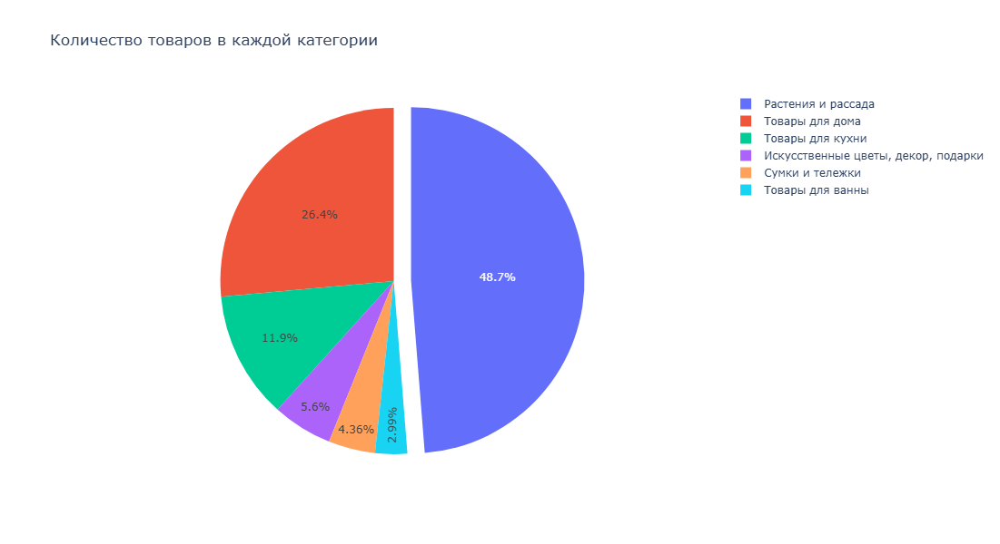

In [72]:
# круговая диаграмма
fig = go.Figure(data = [go.Pie(
    labels=category['product_categ'], 
    values=category['product'],
    pull = [0.1])]) 
fig.update_layout(
    title="Количество товаров в каждой категории",
    height = 600,
    width = 800)
fig.show()

Распределение товаров по категориям интернет-магазина "Пока все еще тут!" следующее:
 - Расстения и рассада - 48,8%;
 - Товары для дома - 26,3%; 
 - Товары для кухни - 11,9%;
 - Искусственные цветы, декор, подарки - 5,61%;
 - Сумки и тележки - 4,36%;
 - Товары для ванны - 3%.
 
Большую часть ассортимента составляют "Растения и рассада". Далее идут "Товары для дома".

In [73]:
grouped = df.groupby(['order_id']).agg({'revenue': 'sum'}).reset_index()
grouped

,order_id,revenue
0,12624,375.0
1,13547,684.0
2,14480,359.0
3,14481,600.0
4,14482,376.0
...,...,...
3515,112722,450.0
3516,112732,90.0
3517,112767,38.0
3518,112779,172.0


In [74]:
# подсчитываем средний чек
average_check = grouped['revenue'].mean()
print('Средний чек: ', average_check.round())

Средний чек:  1119.0


In [75]:
grouped_month = df.groupby([df['date'].dt.strftime('%Y-%m'), 'order_id']).agg({'revenue': 'sum'}).reset_index()
grouped_month

,date,order_id,revenue
0,2018-10,14480,359.0
1,2018-10,14481,600.0
2,2018-10,14482,376.0
3,2018-10,14485,676.0
4,2018-10,14486,1880.0
...,...,...,...
3519,2020-01,112601,134.0
3520,2020-01,112635,2399.0
3521,2020-01,112657,149.0
3522,2020-01,112691,539.0


In [76]:
avg_check_per_month = grouped_month.groupby('date', as_index=False).agg(avg_check=('revenue', 'mean')).reset_index()
avg_check_per_month

,index,date,avg_check
0,0,2018-10,1473.731092
1,1,2018-11,1763.588235
2,2,2018-12,1229.289286
3,3,2019-01,1397.113095
4,4,2019-02,1062.704861
5,5,2019-03,1031.064516
6,6,2019-04,1195.060377
7,7,2019-05,1282.255556
8,8,2019-06,1443.674847
9,9,2019-07,1149.040609


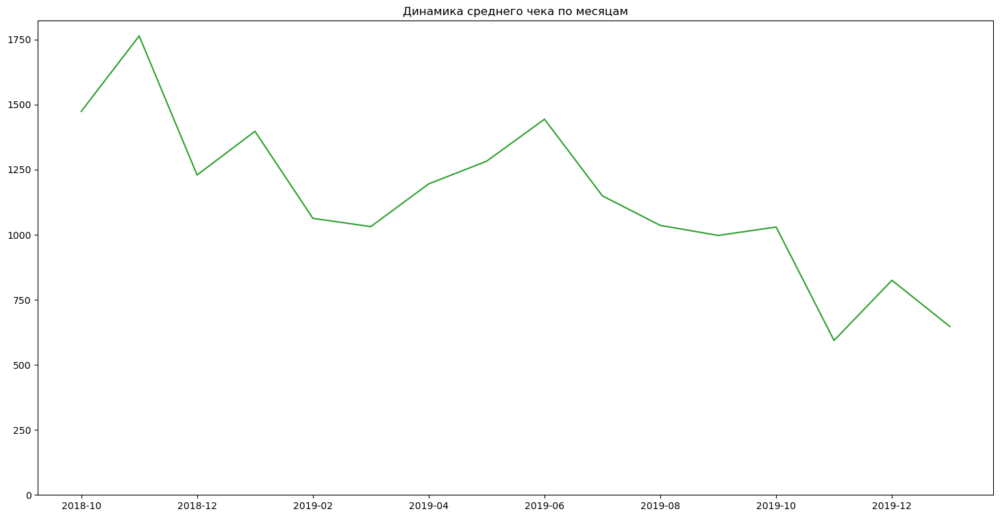

In [77]:
# график динамики среднего чека по месяцам
avg_check_per_month.groupby('date')['avg_check'].sum().plot(figsize=(18, 9), color='C2')
plt.title('Динамика среднего чека по месяцам')
plt.xlabel('')
plt.ylim(bottom=0)  # Устанавливаем нижнюю границу для оси Y
plt.show()

Средний чек по месяцам постепенно снижается с 2018 по 2020 гг.

<a id="analis2"></a>
### Кумулятивная выручка по категориям

In [78]:
# Создадим таблицу с уникальными парами значений: дата и категория товара
dates_categs = df[['date', 'product_categ']].drop_duplicates()
dates_categs

,date,product_categ
0,2018-10-01,Растения и рассада
8,2018-10-01,Товары для дома
15,2018-10-02,Товары для дома
16,2018-10-02,Сумки и тележки
17,2018-10-02,Растения и рассада
...,...,...
5540,2020-01-29,Товары для дома
5545,2020-01-29,Товары для кухни
5546,2020-01-30,Растения и рассада
5549,2020-01-31,Товары для дома


In [79]:
# Агрегированные кумулятивные данные о заказах, покупателях, количестве и выручке по дням
product_agg = (
    dates_categs.apply(
    lambda x: 
        df[np.logical_and(df['date'] <= x['date'], 
                          df['product_categ'] == x ['product_categ'])]
    .agg({'date': 'max', 
          'product_categ': 'max', 
          'order_id': pd.Series.nunique, 
          'customer_id': pd.Series.nunique, 
          'quantity': 'sum', 
          'revenue': 'sum'}),
    axis=1).sort_values(by=['date', 'product_categ']))

In [80]:
product_agg

,date,product_categ,order_id,customer_id,quantity,revenue
0,2018-10-01,Растения и рассада,3,3,9,2475.0
8,2018-10-01,Товары для дома,6,6,110,5786.0
20,2018-10-02,"Искусственные цветы, декор, подарки",1,1,17,976.0
17,2018-10-02,Растения и рассада,8,8,30,5488.0
16,2018-10-02,Сумки и тележки,1,1,1,1049.0
...,...,...,...,...,...,...
5540,2020-01-29,Товары для дома,1002,837,4432,1450869.0
5545,2020-01-29,Товары для кухни,364,331,1210,341476.0
5546,2020-01-30,Растения и рассада,1503,1215,4779,1097048.0
5550,2020-01-31,Растения и рассада,1504,1215,4780,1097176.0


In [81]:
# преобразуем тип данных period в datetime
product_agg['date']=product_agg['date'].dt.to_timestamp()

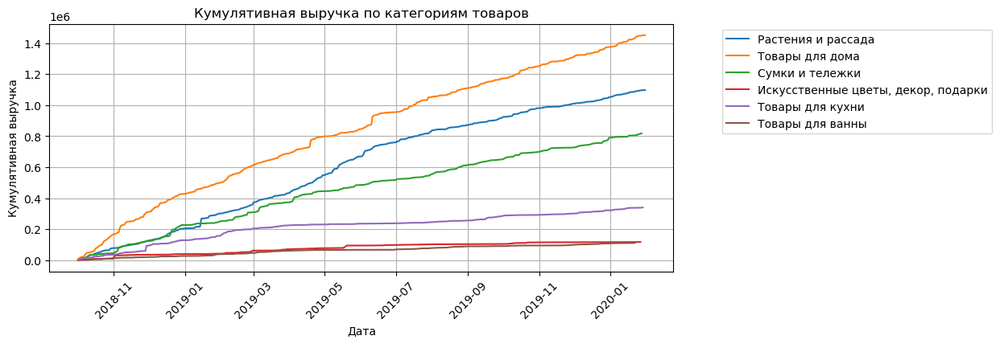

In [82]:
# график кумулятивной выручки по категориям товаров
fig, ax = plt.subplots(figsize=(10,4))
ax.set(title='Кумулятивная выручка по категориям товаров', xlabel='Дата', ylabel='Кумулятивная выручка')
for category in df['product_categ'].unique():
    df_categ = product_agg[product_agg['product_categ'] == category]
    ax.plot(df_categ['date'], df_categ['revenue'], '-', label=category)
xlabels = ax.xaxis.get_ticklabels()
for label in xlabels:
    label.set_rotation(45)
ax.grid()
ax.legend(bbox_to_anchor=(1.52, 1))
plt.show()

Больше всего прибыли за весь период принесли "Товары для дома", "Растения, рассада" и "Сумки и тележки".

<a id="analis3"></a>
### Сезонность товаров

In [83]:
# создадим столбцы с годом и месяцем
df['year'] = df['date'].dt.year
df['month'] = df['date'].dt.month

In [84]:
# функция, которая на основе номера месяца присваивает время года
def get_season(month):
        if month in [12, 1, 2]:
            return 'Зима'
        elif month in [3, 4, 5]:
            return 'Весна'
        elif month in [6, 7, 8]:
            return 'Лето'
        elif month in [9, 10, 11]:
            return 'Осень'
        else:
            return None
    
# создаем новый столбец, которому присваиваем результат нашей функции    
df['season'] = df['month'].apply(get_season)

In [85]:
df.head()

,date,customer_id,order_id,product,quantity,price,revenue,total_revenue,product_categ,rfm_class,rfm_group,year,month,season
0,2018-10-01,ee47d746-6d2f-4d3c-9622-c31412542920,68477,"Комнатное растение в горшке Алое Вера, d12, h30",1,142.0,142.0,1037.0,Растения и рассада,112,Ушедшие клиенты,2018,10,Осень
1,2018-10-01,ee47d746-6d2f-4d3c-9622-c31412542920,68477,"Комнатное растение в горшке Кофе Арабика, d12,...",1,194.0,194.0,1037.0,Растения и рассада,112,Ушедшие клиенты,2018,10,Осень
2,2018-10-01,ee47d746-6d2f-4d3c-9622-c31412542920,68477,Радермахера d-12 см h-20 см,1,112.0,112.0,1037.0,Растения и рассада,112,Ушедшие клиенты,2018,10,Осень
3,2018-10-01,ee47d746-6d2f-4d3c-9622-c31412542920,68477,Хризолидокарпус Лутесценс d-9 см,1,179.0,179.0,1037.0,Растения и рассада,112,Ушедшие клиенты,2018,10,Осень
4,2018-10-01,ee47d746-6d2f-4d3c-9622-c31412542920,68477,Циперус Зумула d-12 см h-25 см,1,112.0,112.0,1037.0,Растения и рассада,112,Ушедшие клиенты,2018,10,Осень


In [86]:
# группируем
season_cat = (
    df.groupby(['season', 'product_categ'], as_index=False)
    .agg(total_sales=('revenue','sum')))
season_cat

,season,product_categ,total_sales
0,Весна,"Искусственные цветы, декор, подарки",32592.0
1,Весна,Растения и рассада,308751.0
2,Весна,Сумки и тележки,175212.0
3,Весна,Товары для ванны,20578.0
4,Весна,Товары для дома,233786.0
5,Весна,Товары для кухни,32282.0
6,Зима,"Искусственные цветы, декор, подарки",29014.0
7,Зима,Растения и рассада,321398.0
8,Зима,Сумки и тележки,277122.0
9,Зима,Товары для ванны,39975.0


In [87]:
# добавляем столбец с долей продаж внутри категории по сезонам в процентах
season_cat['percent_sales'] = (
    season_cat['total_sales'] / season_cat
    .groupby('product_categ')['total_sales'].transform('sum')).round(2)

In [88]:
season_cat

,season,product_categ,total_sales,percent_sales
0,Весна,"Искусственные цветы, декор, подарки",32592.0,0.27
1,Весна,Растения и рассада,308751.0,0.28
2,Весна,Сумки и тележки,175212.0,0.21
3,Весна,Товары для ванны,20578.0,0.18
4,Весна,Товары для дома,233786.0,0.16
5,Весна,Товары для кухни,32282.0,0.09
6,Зима,"Искусственные цветы, декор, подарки",29014.0,0.24
7,Зима,Растения и рассада,321398.0,0.29
8,Зима,Сумки и тележки,277122.0,0.34
9,Зима,Товары для ванны,39975.0,0.36


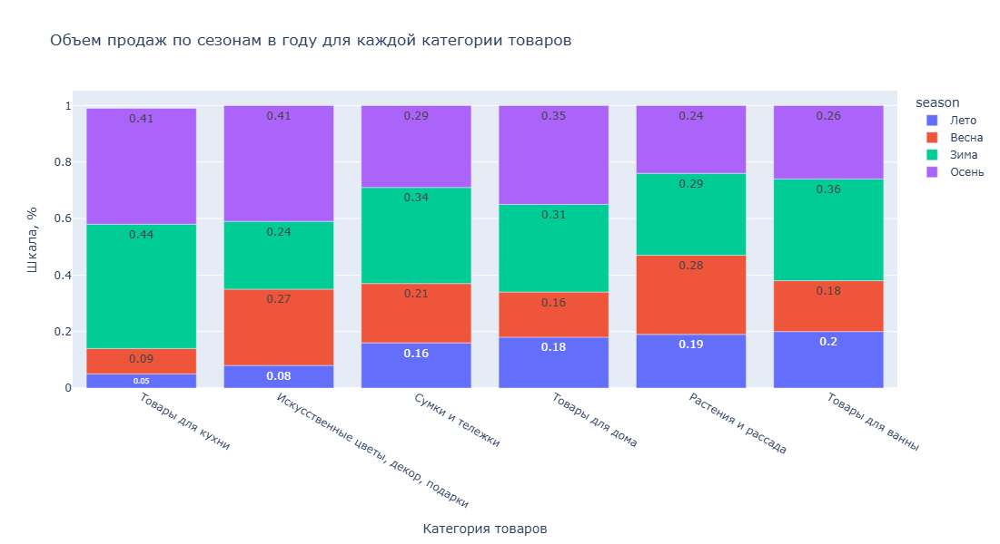

In [89]:
#строим график на основании группировки
fig = px.bar(season_cat.sort_values(by=['percent_sales', 'product_categ'], ascending=True),
             y='percent_sales',
             x='product_categ',
             text= 'percent_sales',
             title="Объем продаж по сезонам в году для каждой категории товаров",
             color='season',
             height=600,
             width=900)
fig.update_layout(xaxis_title = 'Категория товаров',
                  yaxis_title = 'Шкала, %')

fig.show()

Основными сезонами продаж каждой категории товаров являются осень и зима. Летом продаж меньше всего.

<a id="analis4"></a>
### Динамика выручки по месяцам

In [90]:
revenue_per_month = df.pivot_table(index=[df['date'].dt.strftime('%Y-%m'), 'rfm_group'], 
                                   values=['customer_id', 'revenue', 'order_id'], 
                                   aggfunc={'customer_id':'nunique', 'revenue':'sum', 'order_id':'nunique'}).reset_index()
revenue_per_month.head(5)

,date,rfm_group,customer_id,order_id,revenue
0,2018-10,Неактивные клиенты,48,68,84207.0
1,2018-10,Ушедшие клиенты,131,170,266541.0
2,2018-11,Неактивные клиенты,48,67,81109.0
3,2018-11,Ушедшие клиенты,130,137,278663.0
4,2018-12,Неактивные клиенты,34,76,82065.0


In [91]:
grouped_revenue = df.pivot_table(index=[df['date'].dt.strftime('%Y-%m')], 
                                   values=['revenue'], 
                                   aggfunc={'revenue':'sum'}).reset_index()
grouped_revenue

,date,revenue
0,2018-10,350748.0
1,2018-11,359772.0
2,2018-12,344201.0
3,2019-01,234715.0
4,2019-02,306059.0
5,2019-03,255704.0
6,2019-04,316691.0
7,2019-05,230806.0
8,2019-06,235319.0
9,2019-07,226361.0


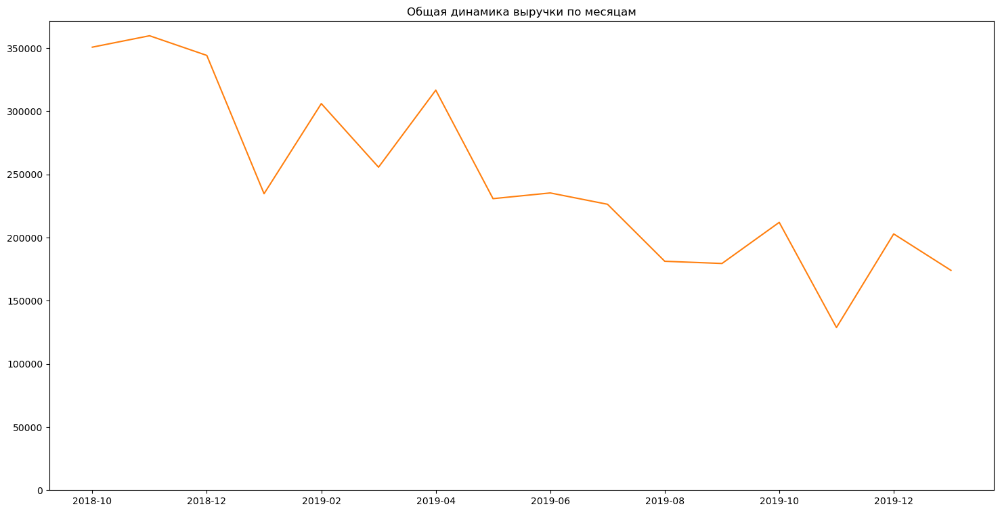

In [92]:
grouped_revenue.groupby('date')['revenue'].sum().plot(figsize=(18, 9), color='C1')
plt.title('Общая динамика выручки по месяцам')
plt.xlabel('')
plt.ylim(bottom=0)  # Устанавливаем нижнюю границу для оси Y
plt.show()

Вывод: общая выручка по месяцам падает с конца 2018 года.

<a id="analis5"></a>
### Динамика средней выручки с покупателя по месяцам

In [93]:
# сводная таблица
arpu = df.pivot_table(index=[df['date'].dt.strftime('%Y-%m')], 
                                   values=['customer_id', 'revenue'], 
                                   aggfunc={'customer_id':'nunique', 'revenue':'sum'}).reset_index()
arpu.columns = ['year-month', 'count_customer_id', 'month_revenue']
arpu

,year-month,count_customer_id,month_revenue
0,2018-10,179,350748.0
1,2018-11,178,359772.0
2,2018-12,230,344201.0
3,2019-01,152,234715.0
4,2019-02,246,306059.0
5,2019-03,233,255704.0
6,2019-04,236,316691.0
7,2019-05,166,230806.0
8,2019-06,153,235319.0
9,2019-07,185,226361.0


In [94]:
# в столбце считаем среднюю выручку с покупателя
arpu['arpu'] = arpu['month_revenue'] / arpu['count_customer_id']
arpu

,year-month,count_customer_id,month_revenue,arpu
0,2018-10,179,350748.0,1959.486034
1,2018-11,178,359772.0,2021.191011
2,2018-12,230,344201.0,1496.526087
3,2019-01,152,234715.0,1544.177632
4,2019-02,246,306059.0,1244.142276
5,2019-03,233,255704.0,1097.442060
6,2019-04,236,316691.0,1341.911017
7,2019-05,166,230806.0,1390.397590
8,2019-06,153,235319.0,1538.032680
9,2019-07,185,226361.0,1223.572973


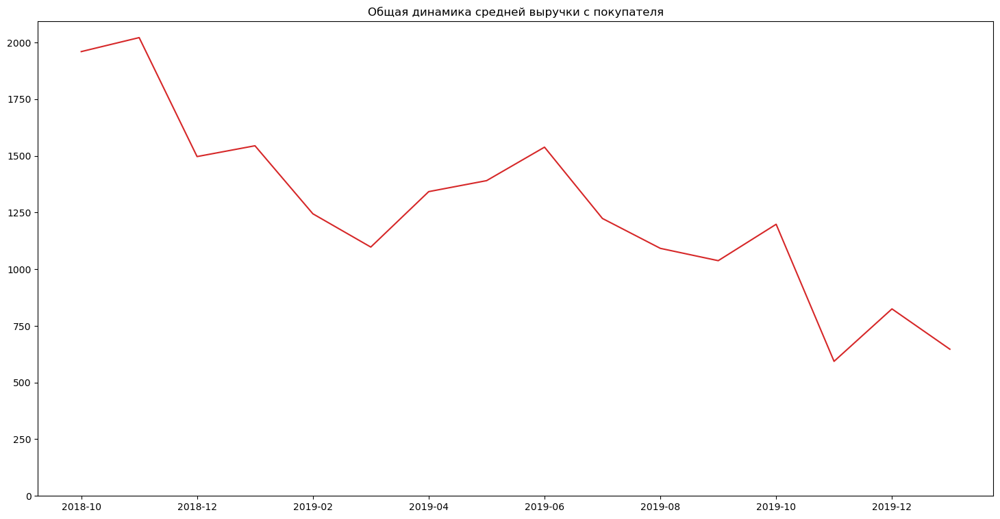

In [95]:
# строим график
arpu.groupby('year-month')['arpu'].sum().plot(figsize=(18, 9), color='C3')
plt.title('Общая динамика средней выручки с покупателя')
plt.xlabel('')
plt.ylim(bottom=0)  # Устанавливаем нижнюю границу для оси Y
plt.show()

Вывод: Средняя выручка с покупателя постепенно снижается в течение исследуемого периода.

<a id="analis6"></a>
### Анализ сегментов покупателей

<a id="analis7"></a>
#### Количество покупателей в каждой группе

In [96]:
# сводная таблица с количеством покупателей в каждом сегменте
grouped_rfm_group = df.pivot_table(index=['rfm_group'], 
                                   values=['customer_id'], 
                                   aggfunc={'customer_id':'nunique'}).reset_index()
grouped_rfm_group

,rfm_group,customer_id
0,Неактивные клиенты,1222
1,Постоянные клиенты,609
2,Ушедшие клиенты,597


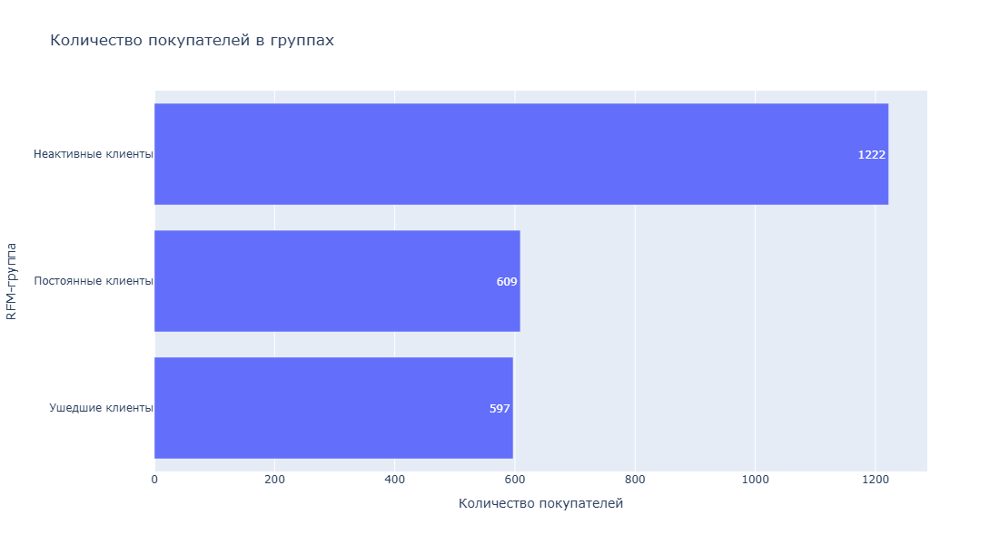

In [97]:
#строим график на основании группировки
fig = px.bar(grouped_rfm_group.sort_values(by='customer_id', ascending=True),
             y='rfm_group',
             x='customer_id',
             text= 'customer_id',
             title="Количество покупателей в группах",
             height=600,
             width=900)
fig.update_layout(xaxis_title = 'Количество покупателей',
                  yaxis_title = 'RFM-группа')

fig.show()

Неактивные клиенты составляют наибольшую часть. Доля постоянных и ушедших клиентов одинакова.

<a id="analis8"></a>
#### Средний чек

In [98]:
# группируем данные
grouped_rfm = df.groupby(['rfm_group', 'order_id']).agg({"revenue":"sum"}).reset_index()
grouped_rfm

,rfm_group,order_id,revenue
0,Неактивные клиенты,12624,375.0
1,Неактивные клиенты,14522,1418.0
2,Неактивные клиенты,14531,787.0
3,Неактивные клиенты,14538,90.0
4,Неактивные клиенты,14541,783.0
...,...,...,...
3515,Ушедшие клиенты,70365,3674.0
3516,Ушедшие клиенты,70366,134.0
3517,Ушедшие клиенты,70372,449.0
3518,Ушедшие клиенты,70373,314.0


In [99]:
# подсчитываем средний чек
avg_check_rfm = (
    grouped_rfm.groupby('rfm_group', as_index=False)
    .agg(avg_check=("revenue", "mean"))
    .round()
    .sort_values(by='avg_check', ascending=False))
avg_check_rfm

,rfm_group,avg_check
2,Ушедшие клиенты,1551.0
0,Неактивные клиенты,1132.0
1,Постоянные клиенты,862.0


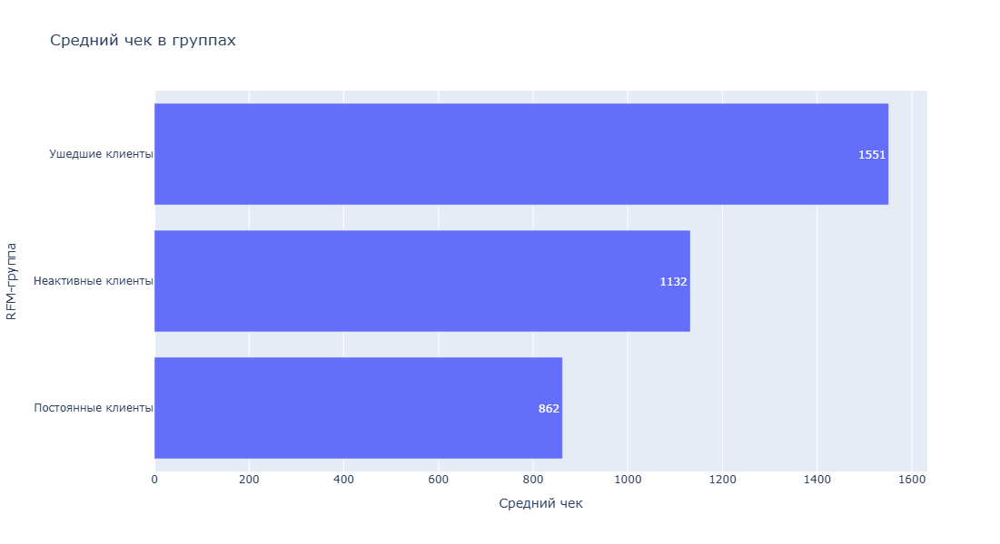

In [100]:
#строим график на основании группировки
fig = px.bar(avg_check_rfm.sort_values(by='avg_check', ascending=True),
             y='rfm_group',
             x='avg_check',
             text= 'avg_check',
             title="Средний чек в группах",
             height=600,
             width=900)
fig.update_layout(xaxis_title = 'Средний чек',
                  yaxis_title = 'RFM-группа')

fig.show()

Наибольший средний чек был у ушедних клиентов.

<a id="analis9"></a>
#### Основные категории

In [101]:
categ_rfm1 = (df
            .query('rfm_group== "Ушедшие клиенты"')
            .pivot_table(index='product_categ', values='product', aggfunc='nunique')
            .sort_values(by='product', ascending=False).reset_index())
display(categ_rfm1)

,product_categ,product
0,Растения и рассада,261
1,Товары для дома,256
2,Товары для кухни,149
3,"Искусственные цветы, декор, подарки",80
4,Сумки и тележки,36
5,Товары для ванны,24


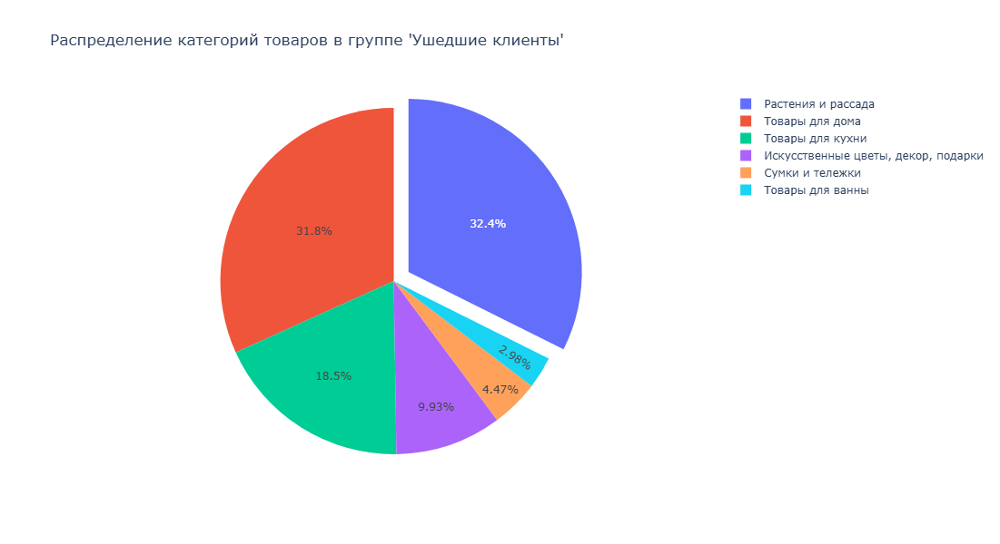

In [102]:
# круговая диаграмма
fig = go.Figure(data = [go.Pie(
    labels=categ_rfm1['product_categ'], 
    values=categ_rfm1['product'],
    pull = [0.1])]) 
fig.update_layout(
    title="Распределение категорий товаров в группе 'Ушедшие клиенты'",
    height = 600,
    width = 800)
fig.show()

ТОП-3 категорий для Ушедших клиентов:
  - Растения и рассада;
  - Товары для дома;
  - Товары для кухни.

In [103]:
categ_rfm2 = (df
            .query('rfm_group== "Неактивные клиенты"')
            .pivot_table(index='product_categ', values='product', aggfunc='nunique')
            .sort_values(by='product', ascending=False).reset_index())
display(categ_rfm2)

,product_categ,product
0,Растения и рассада,917
1,Товары для дома,337
2,Товары для кухни,113
3,"Искусственные цветы, декор, подарки",80
4,Сумки и тележки,66
5,Товары для ванны,31


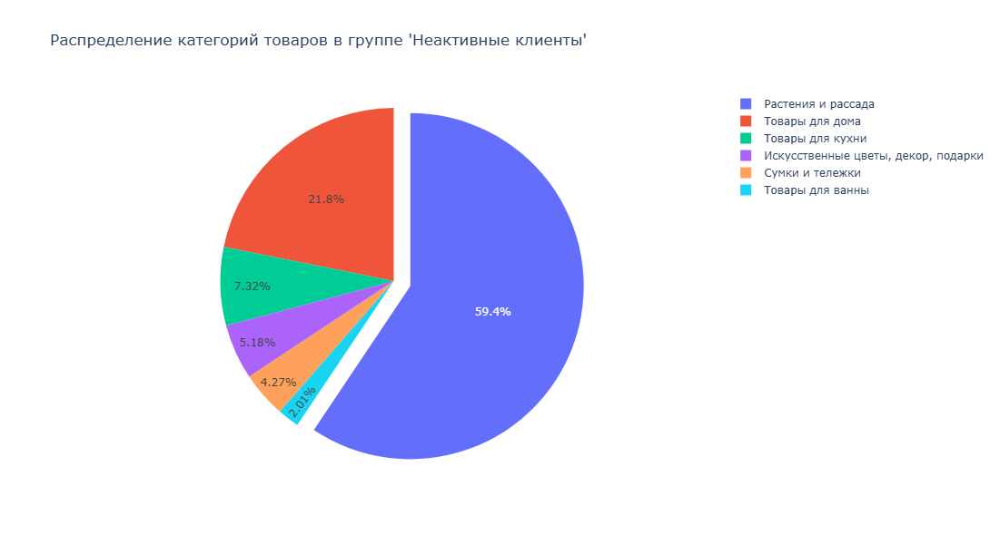

In [104]:
# круговая диаграмма
fig = go.Figure(data = [go.Pie(
    labels=categ_rfm2['product_categ'], 
    values=categ_rfm2['product'],
    pull = [0.1])]) 
fig.update_layout(
    title="Распределение категорий товаров в группе 'Неактивные клиенты'",
    height = 600,
    width = 800)
fig.show()

Аналогичные самые популярные категории для Неактивных клиентов:
   - Растения и рассада;
   - Товары для дома;
   - Товары для кухни.

In [105]:
categ_rfm3 = (df
            .query('rfm_group== "Постоянные клиенты"')
            .pivot_table(index='product_categ', values='product', aggfunc='nunique')
            .sort_values(by='product', ascending=False).reset_index())
display(categ_rfm3)

,product_categ,product
0,Растения и рассада,318
1,Товары для дома,220
2,Товары для кухни,84
3,Сумки и тележки,50
4,"Искусственные цветы, декор, подарки",33
5,Товары для ванны,30


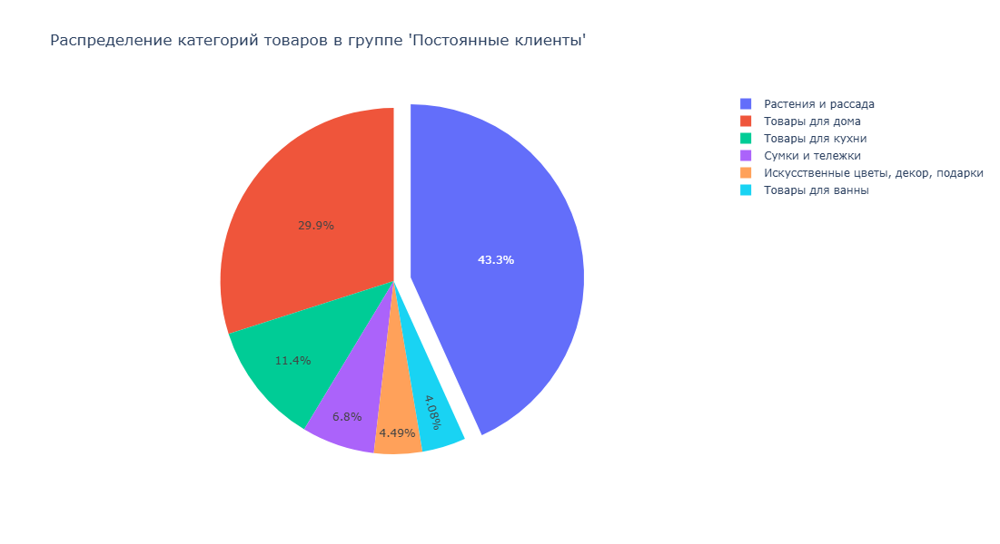

In [106]:
# круговая диаграмма
fig = go.Figure(data = [go.Pie(
    labels=categ_rfm3['product_categ'], 
    values=categ_rfm3['product'],
    pull = [0.1])]) 
fig.update_layout(
    title="Распределение категорий товаров в группе 'Постоянные клиенты'",
    height = 600,
    width = 800)
fig.show()

Ничего не изменилось для Постоянных клиентов.

<a id="analis10"></a>
#### Сезонность товаров для сегментов покупателей

In [107]:
# сводная таблица для категории Ушедшие клиенты
season_cat_rfm1 = (df
                   .query('rfm_group== "Ушедшие клиенты"')
                   .pivot_table(index=[df['date'].dt.strftime('%Y-%m'), 'season', 'rfm_group', 'product_categ'], 
                                values=['product', 'revenue'], 
                                aggfunc={'product':'nunique', 'revenue':'sum'})
                   .sort_values(by=['date'], ascending=True)
                   .reset_index())
season_cat_rfm1.columns = ['date', 'season', 'rfm_group', 'category', 'total_count', 'total_revenue']
season_cat_rfm1

,date,season,rfm_group,category,total_count,total_revenue
0,2018-10,Осень,Ушедшие клиенты,"Искусственные цветы, декор, подарки",42,9623.0
1,2018-10,Осень,Ушедшие клиенты,Растения и рассада,119,63960.0
2,2018-10,Осень,Ушедшие клиенты,Сумки и тележки,13,27534.0
3,2018-10,Осень,Ушедшие клиенты,Товары для ванны,11,10452.0
4,2018-10,Осень,Ушедшие клиенты,Товары для дома,112,123321.0
5,2018-10,Осень,Ушедшие клиенты,Товары для кухни,32,31651.0
6,2018-11,Осень,Ушедшие клиенты,"Искусственные цветы, декор, подарки",39,24666.0
7,2018-11,Осень,Ушедшие клиенты,Растения и рассада,83,28403.0
8,2018-11,Осень,Ушедшие клиенты,Сумки и тележки,15,46666.0
9,2018-11,Осень,Ушедшие клиенты,Товары для ванны,10,6799.0


In [108]:
season_cat_rfm1['date'] = pd.to_datetime(season_cat_rfm1['date'])

In [109]:
# получаем уникальные категории
unique_categories = df['product_categ'].unique()

In [110]:
# задаем палетту цветов для наших категорий
colors = sns.color_palette("husl", len(unique_categories))
custom_palette = dict(zip(unique_categories, colors))

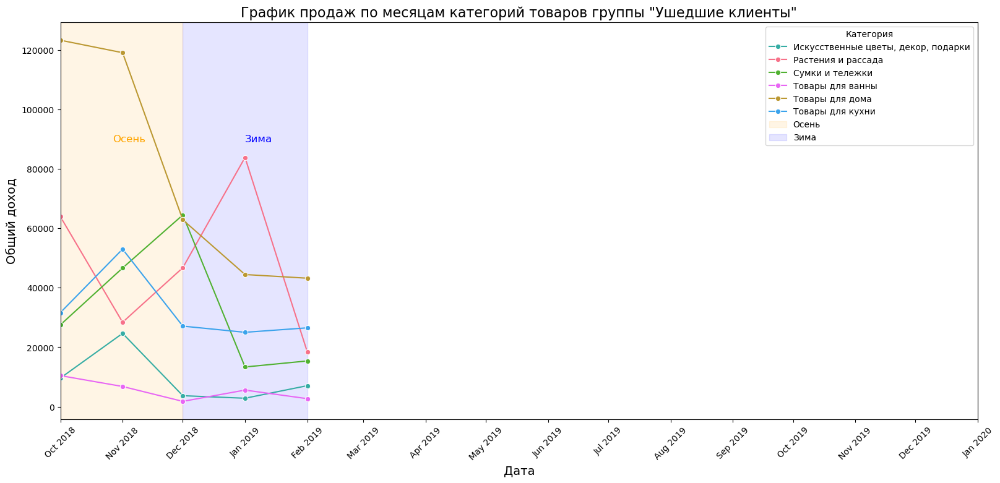

In [111]:
# Построим график
plt.figure(figsize=(16, 8))

sns.lineplot(data=season_cat_rfm1, x='date', y='total_revenue', hue='category', marker='o', palette=custom_palette)

# Закрашивание зон
plt.axvspan(pd.Timestamp('2018-10'), pd.Timestamp('2018-12'), color='orange', alpha=0.1, label='Осень')
plt.axvspan(pd.Timestamp('2018-12'), pd.Timestamp('2019-02'), color='blue', alpha=0.1, label='Зима')

# Добавляем подписи для зон
plt.text(pd.Timestamp('2018-10-27'), 90000, 'Осень', color='orange', fontsize=12, verticalalignment='center')
plt.text(pd.Timestamp('2019-01'), 90000, 'Зима', color='blue', fontsize=12, verticalalignment='center')

plt.title('График продаж по месяцам категорий товаров группы "Ушедшие клиенты"', fontsize=16)
plt.xlabel('Дата', fontsize=14)
plt.ylabel('Общий доход', fontsize=14)
plt.xticks(rotation=45)
plt.legend(title='Категория', loc='upper right')
plt.tight_layout()

# Диапазон оси Х
plt.xlim(pd.Timestamp('2018-10'), pd.Timestamp('2020-01'))  # Задаем пределы оси X

# Изменение формата даты на оси X
plt.gca().xaxis.set_major_formatter(plt.FixedFormatter(pd.date_range(start='2018-10-01', end='2020-01-01', freq='MS').strftime('%b %Y')))

# Устанавливаем деление по месяцам
plt.gca().xaxis.set_major_locator(plt.matplotlib.dates.MonthLocator())

# Покажем график
plt.show() 

Рекомендованные топ-категории для таргетной рекламной рассылки группе "Ушедшие клиенты":
 - Октябрь: Товары для дома, Растения и рассада, Товары для кухни;
 - Ноябрь: Товары для дома, Товары для кухни, Сумки и тележки;
 - Декабрь: Сумки и тележки, Товары для дома, Растения и рассада;
 - Январь: Растения и рассада, Товары для дома, Товары для кухни;
 - Февраль: Товары для дома, Товары для кухни, Растения и рассада.

In [112]:
# сводная таблица группы Неактивные клиенты
season_cat_rfm2 = (df
                   .query('rfm_group== "Неактивные клиенты"')
                   .pivot_table(index=[df['date'].dt.strftime('%Y-%m'), 'season', 'rfm_group', 'product_categ'], 
                                values=['product', 'revenue'], 
                                aggfunc={'product':'nunique', 'revenue':'sum'})
                   .sort_values(by=['date'], ascending=True)
                   .reset_index())
season_cat_rfm2.columns = ['date', 'season', 'rfm_group', 'category', 'total_count', 'total_revenue']
season_cat_rfm2

,date,season,rfm_group,category,total_count,total_revenue
0,2018-10,Осень,Неактивные клиенты,"Искусственные цветы, декор, подарки",2,1770.0
1,2018-10,Осень,Неактивные клиенты,Растения и рассада,18,14694.0
2,2018-10,Осень,Неактивные клиенты,Сумки и тележки,9,18074.0
3,2018-10,Осень,Неактивные клиенты,Товары для ванны,2,2173.0
4,2018-10,Осень,Неактивные клиенты,Товары для дома,28,42811.0
...,...,...,...,...,...,...
74,2019-11,Осень,Неактивные клиенты,"Искусственные цветы, декор, подарки",4,284.0
75,2019-11,Осень,Неактивные клиенты,Растения и рассада,48,9875.0
76,2019-11,Осень,Неактивные клиенты,Сумки и тележки,8,25951.0
77,2019-11,Осень,Неактивные клиенты,Товары для ванны,2,578.0


In [113]:
season_cat_rfm2['date'] = pd.to_datetime(season_cat_rfm2['date'])

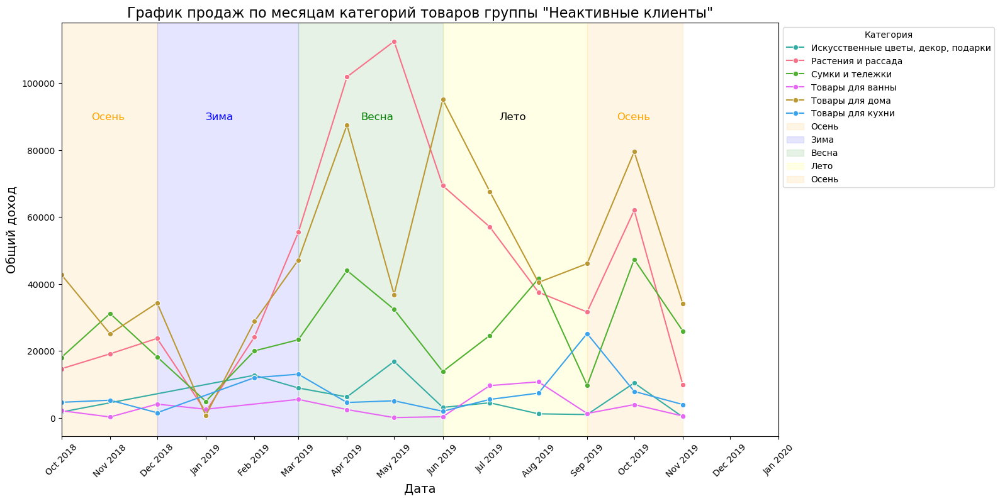

In [114]:
# Построим график
plt.figure(figsize=(16, 8))

sns.lineplot(data=season_cat_rfm2, x='date', y='total_revenue', hue='category', marker='o', palette=custom_palette)

# Закрашивание зон
plt.axvspan(pd.Timestamp('2018-10'), pd.Timestamp('2018-12'), color='orange', alpha=0.1, label='Осень')
plt.axvspan(pd.Timestamp('2018-12'), pd.Timestamp('2019-03'), color='blue', alpha=0.1, label='Зима')
plt.axvspan(pd.Timestamp('2019-03'), pd.Timestamp('2019-06'), color='green', alpha=0.1, label='Весна')
plt.axvspan(pd.Timestamp('2019-06'), pd.Timestamp('2019-09'), color='yellow', alpha=0.1, label='Лето')
plt.axvspan(pd.Timestamp('2019-09'), pd.Timestamp('2019-11'), color='orange', alpha=0.1, label='Осень')

# Добавляем подписи для зон
plt.text(pd.Timestamp('2018-10-20'), 90000, 'Осень', color='orange', fontsize=12, verticalalignment='center')
plt.text(pd.Timestamp('2019-01'), 90000, 'Зима', color='blue', fontsize=12, verticalalignment='center')
plt.text(pd.Timestamp('2019-04-10'), 90000, 'Весна', color='green', fontsize=12, verticalalignment='center')
plt.text(pd.Timestamp('2019-07-07'), 90000, 'Лето', color='black', fontsize=12, verticalalignment='center')
plt.text(pd.Timestamp('2019-09-20'), 90000, 'Осень', color='orange', fontsize=12, verticalalignment='center')

plt.title('График продаж по месяцам категорий товаров группы "Неактивные клиенты"', fontsize=16)
plt.xlabel('Дата', fontsize=14)
plt.ylabel('Общий доход', fontsize=14)
plt.xticks(rotation=45)
plt.legend(title='Категория', bbox_to_anchor=(1, 1), loc='upper left')
plt.tight_layout()

# Диапазон оси Х
plt.xlim(pd.Timestamp('2018-10'), pd.Timestamp('2020-01'))  # Задаем пределы оси X

# Изменение формата даты на оси X
plt.gca().xaxis.set_major_formatter(plt.FixedFormatter(pd.date_range(start='2018-10-01', end='2020-01-01', freq='MS').strftime('%b %Y')))

# Устанавливаем деление по месяцам
plt.gca().xaxis.set_major_locator(plt.matplotlib.dates.MonthLocator())

# Покажем график
plt.show() 

Рекомендованные топ-категории для таргетной рекламной рассылки группе "Неактивные клиенты":
 - Октябрь: Товары для дома, Сумки и тележки, Растения и рассада;
 - Ноябрь: Сумки и тележки, Товары для дома, Растения и рассада;
 - Декабрь: Товары для дома, Растения и рассада; Сумки и тележки;
 - Январь: Провал продаж по всем категориям - можно не тратить деньги на рассылки;
 - Февраль-Июнь: Растения и рассада, Товары для дома, Сумки и тележки;
 - Июль: Товары для дома, Растения и рассада; Сумки и тележки;
 - Август: Товары для дома, Растения и рассада; Сумки и тележки;
 - Сентябрь: Товары для дома, Растения и рассада; Товары для кухни;
 - Октябрь: Товары для дома, Растения и рассада; Сумки и тележки;
 - Ноябрь: Товары для дома, Сумки и тележки, Растения и рассада.

In [115]:
pd.set_option('display.max_rows', None)
# pd.reset_option('display.max_rows')

In [116]:
# сводная таблица группы Постоянные клиенты
season_cat_rfm3 = (df
                   .query('rfm_group== "Постоянные клиенты"')
                   .pivot_table(index=[df['date'].dt.strftime('%Y-%m'), 'season', 'rfm_group', 'product_categ'], 
                                values=['product', 'revenue'], 
                                aggfunc={'product':'nunique', 'revenue':'sum'})
                   .sort_values(by=['date'], ascending=True)
                   .reset_index())
season_cat_rfm3.columns = ['date', 'season', 'rfm_group', 'category', 'total_count', 'total_revenue']
season_cat_rfm3

,date,season,rfm_group,category,total_count,total_revenue
0,2018-12,Зима,Постоянные клиенты,Растения и рассада,9,6554.0
1,2018-12,Зима,Постоянные клиенты,Сумки и тележки,9,21066.0
2,2018-12,Зима,Постоянные клиенты,Товары для ванны,3,2188.0
3,2018-12,Зима,Постоянные клиенты,Товары для дома,20,19673.0
4,2018-12,Зима,Постоянные клиенты,Товары для кухни,7,5920.0
5,2019-01,Зима,Постоянные клиенты,Товары для дома,20,27674.0
6,2019-01,Зима,Постоянные клиенты,Товары для ванны,3,3560.0
7,2019-01,Зима,Постоянные клиенты,Товары для кухни,6,3791.0
8,2019-01,Зима,Постоянные клиенты,Растения и рассада,18,12741.0
9,2019-01,Зима,Постоянные клиенты,Сумки и тележки,1,1574.0


In [117]:
season_cat_rfm3['date'] = pd.to_datetime(season_cat_rfm3['date'])

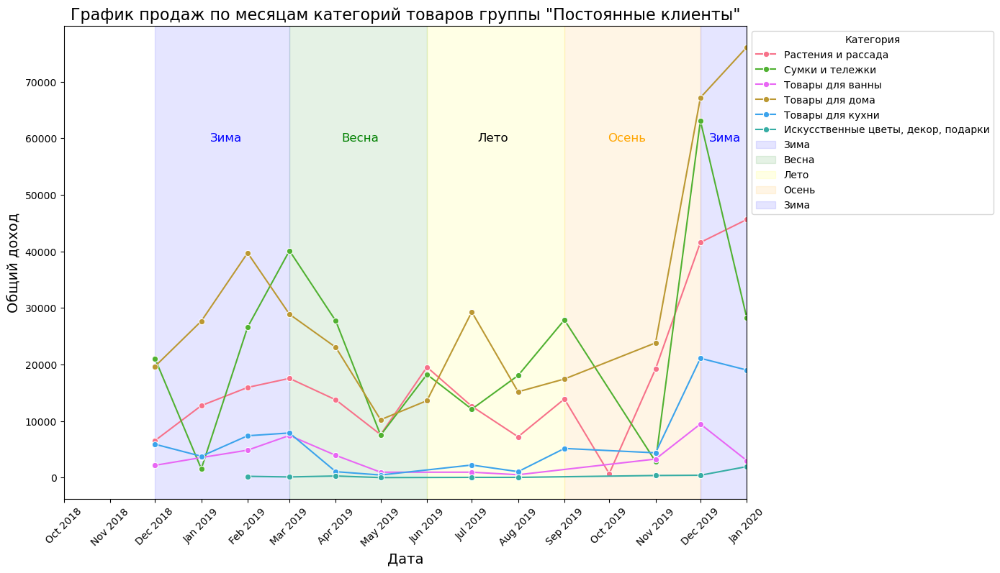

In [118]:
# Построим график
plt.figure(figsize=(14, 8))

sns.lineplot(data=season_cat_rfm3, x='date', y='total_revenue', hue='category', marker='o', palette=custom_palette)

# Закрашивание зон
plt.axvspan(pd.Timestamp('2018-12'), pd.Timestamp('2019-03'), color='blue', alpha=0.1, label='Зима')
plt.axvspan(pd.Timestamp('2019-03'), pd.Timestamp('2019-06'), color='green', alpha=0.1, label='Весна')
plt.axvspan(pd.Timestamp('2019-06'), pd.Timestamp('2019-09'), color='yellow', alpha=0.1, label='Лето')
plt.axvspan(pd.Timestamp('2019-09'), pd.Timestamp('2019-12'), color='orange', alpha=0.1, label='Осень')
plt.axvspan(pd.Timestamp('2019-12'), pd.Timestamp('2020-01'), color='blue', alpha=0.1, label='Зима')

# Добавляем подписи для зон
plt.text(pd.Timestamp('2019-01-07'), 60000, 'Зима', color='blue', fontsize=12, verticalalignment='center')
plt.text(pd.Timestamp('2019-04-05'), 60000, 'Весна', color='green', fontsize=12, verticalalignment='center')
plt.text(pd.Timestamp('2019-07-05'), 60000, 'Лето', color='black', fontsize=12, verticalalignment='center')
plt.text(pd.Timestamp('2019-09-30'), 60000, 'Осень', color='orange', fontsize=12, verticalalignment='center')
plt.text(pd.Timestamp('2019-12-07'), 60000, 'Зима', color='blue', fontsize=12, verticalalignment='center')

plt.title('График продаж по месяцам категорий товаров группы "Постоянные клиенты"', fontsize=16)
plt.xlabel('Дата', fontsize=14)
plt.ylabel('Общий доход', fontsize=14)
plt.xticks(rotation=45)
plt.legend(title='Категория', bbox_to_anchor=(1, 1), loc='upper left')
plt.tight_layout()

# Диапазон оси Х
plt.xlim(pd.Timestamp('2018-10'), pd.Timestamp('2020-01'))  # Задаем пределы оси X

# Изменение формата даты на оси X
plt.gca().xaxis.set_major_formatter(plt.FixedFormatter(pd.date_range(start='2018-10-01', end='2020-01-01', freq='MS').strftime('%b %Y')))

# Устанавливаем деление по месяцам
plt.gca().xaxis.set_major_locator(plt.matplotlib.dates.MonthLocator())

# Покажем график
plt.show() 

Рекомендованные топ-категории для таргетной рекламной рассылки группе "Постоянные клиенты":
 - Декабрь: Сумки и тележки, Товары для дома, Растения и рассада;
 - Январь: Товары для дома, Растения и рассада;
 - Февраль: Товары для дома, Сумки и тележки, Растения и рассада;
 - Март-Май: Сумки и тележки, Товары для дома, Растения и рассада;
 - Июнь: Растения и рассада, Сумки и тележки, Товары для дома;
 - Июль: Товары для дома, Растения и рассада; Сумки и тележки;
 - Август: Сумки и тележки, Товары для дома, Растения и рассада;
 - Сентябрь: Сумки и тележки, Товары для дома, Растения и рассада;
 - Октябрь: Товары для дома, Сумки и тележки; Товары для кухни;
 - Ноябрь: Товары для дома, Растения и рассада, Товары для кухни;
 - Декабрь: Товары для дома, Сумки и тележки, Растения и рассада;
 - Январь: Товары для дома, Растения и рассада, Сумки и тележки.

<a id="hypot"></a>
## Проверка гипотез

In [119]:
# сводная таблица выручки по группам и клиентам
groups = df.pivot_table(index=['rfm_group', 'customer_id'], 
                                   values=['revenue', 'order_id'], 
                                   aggfunc={'revenue':'sum', 'order_id':'nunique'}).reset_index()
groups

,rfm_group,customer_id,order_id,revenue
0,Неактивные клиенты,000d6849-084e-4d9f-ac03-37174eaf60c4,1,555.0
1,Неактивные клиенты,00299f34-5385-4d13-9aea-c80b81658e1b,1,914.0
2,Неактивные клиенты,003bbd39-0000-41ff-b7f9-2ddaec152037,1,2324.0
3,Неактивные клиенты,005ba170-45e8-42de-93f7-192481ae2659,2,7857.0
4,Неактивные клиенты,00e59a12-06d5-47fc-9a33-bfc53aca1e9f,1,1798.0
5,Неактивные клиенты,0114e87e-78e2-49bf-9c8c-bbddd7191a3f,1,974.0
6,Неактивные клиенты,0131d2f9-e553-4cb6-ac85-f96e9cb7cb47,1,1574.0
7,Неактивные клиенты,0161a155-59b3-4613-a6ff-2e6bfcc00463,1,2699.0
8,Неактивные клиенты,01626eda-0717-4a39-826e-1982a358576d,1,599.0
9,Неактивные клиенты,0184f535-b60a-4914-a982-231e3f615206,5,5891.0


In [120]:
# выделяем группы клиентов в отдельные таблицы
rfm1 = groups[groups['rfm_group']=='Ушедшие клиенты']
rfm2 = groups[groups['rfm_group']=='Неактивные клиенты']
rfm3 = groups[groups['rfm_group']=='Постоянные клиенты']

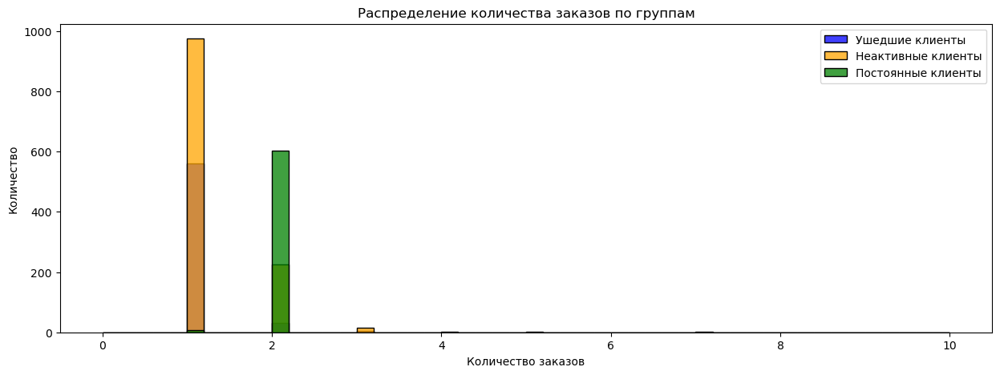

In [121]:
# гистограмма количества заказов по группам клиентов
fig, axs = plt.subplots(figsize=(15, 5))

sns.histplot(data=rfm1, x="order_id", bins=50, binrange=(0, 10), color="blue")
sns.histplot(data=rfm2, x="order_id", bins=50, binrange=(0, 10), color="orange")
sns.histplot(data=rfm3, x="order_id", bins=50, binrange=(0, 10), color="green")
plt.xlabel("Количество заказов")
plt.ylabel("Количество")
plt.title("Распределение количества заказов по группам")
plt.legend (('Ушедшие клиенты', 'Неактивные клиенты', 'Постоянные клиенты'))
plt.show()

На графике видно, что данные не распределены нормально. Дополнительно проверим с помощью теста Шапиро.

In [122]:
# проверяем, что данные в столбце 'order_id' нормально распределены
stat, p_value = shapiro(rfm1['order_id'])

print('Статистика теста:', stat)
print('P-значение:', p_value)

alpha = 0.05
if p_value > alpha:
    print('Данные распределены нормально')
else:
    print('Данные не распределены нормально')

Статистика теста: 0.052113534667925676
P-значение: 4.94905887038627e-47
Данные не распределены нормально


In [123]:
# проверяем, что данные в столбце 'order_id' нормально распределены
stat, p_value = shapiro(rfm2['order_id'])

print('Статистика теста:', stat)
print('P-значение:', p_value)

alpha = 0.05
if p_value > alpha:
    print('Данные распределены нормально')
else:
    print('Данные не распределены нормально')

Статистика теста: 0.040876439517377405
P-значение: 4.4701173406712015e-61
Данные не распределены нормально


In [124]:
# проверяем, что данные в столбце 'order_id' нормально распределены
stat, p_value = shapiro(rfm3['order_id'])

print('Статистика теста:', stat)
print('P-значение:', p_value)

alpha = 0.05
if p_value > alpha:
    print('Данные распределены нормально')
else:
    print('Данные не распределены нормально')

Статистика теста: 0.0712985111448674
P-значение: 4.498513205616981e-47
Данные не распределены нормально


Так как данные о количестве заказов не распределены нормально, то необходимо для проверки гипотез использовать тест маннауитни

<a id="hypot1"></a>
### Проверка гипотезы о среднем количестве заказов

Нулевая: различий в среднем количестве заказов между группами нет.

Альтернативная: различия в среднем количестве между группами есть.

In [125]:
# проверка гипотезы для групп rfm1 и rfm2
alpha = 0.05

results1 = stats.mannwhitneyu(rfm1['order_id'], rfm2['order_id'])[1]

print(round(results1, 40))

if results1 < alpha:
    print('Отвергаем нулевую гипотезу: разница статистически значима')
else:
    print('Не получилось отвергнуть нулевую гипотезу, вывод о различии сделать нельзя')

7.668897177809392e-15
Отвергаем нулевую гипотезу: разница статистически значима


In [126]:
# проверка гипотезы для групп rfm1 и rfm3
alpha = 0.05

results2 = stats.mannwhitneyu(rfm1['order_id'], rfm3['order_id'])[1]

print(round(results2, 300))

if results2 < alpha:
    print('Отвергаем нулевую гипотезу: разница статистически значима')
else:
    print('Не получилось отвергнуть нулевую гипотезу, вывод о различии сделать нельзя')

2.727602336870795e-223
Отвергаем нулевую гипотезу: разница статистически значима


In [127]:
# проверка гипотезы для групп rfm2 и rfm3
alpha = 0.05

results3 = stats.mannwhitneyu(rfm2['order_id'], rfm3['order_id'])[1]

print(round(results3, 300))

if results3 < alpha:
    print('Отвергаем нулевую гипотезу: разница статистически значима')
else:
    print('Не получилось отвергнуть нулевую гипотезу, вывод о различии сделать нельзя')

1.3891503089692922e-210
Отвергаем нулевую гипотезу: разница статистически значима


Вывод: для всех пар групп не удалось подтвердить нулевую гипотезу. Разница между группами в среднем количестве заказов статистически значима.

<a id="hypot2"></a>
### Проверка гипотезы о среднем чеке

Нулевая: различий в среднем чеке заказа между группами нет.

Альтернативная: различия в среднем чеке между группами есть.

In [128]:
# сводные таблицы с общей суммой заказов для каждой группы
grouped_rfm1 = df[df['rfm_group']=='Ушедшие клиенты'].groupby('order_id').agg({"revenue":"sum"}).reset_index()
grouped_rfm2 = df[df['rfm_group']=='Неактивные клиенты'].groupby('order_id').agg({"revenue":"sum"}).reset_index()
grouped_rfm3 = df[df['rfm_group']=='Постоянные клиенты'].groupby('order_id').agg({"revenue":"sum"}).reset_index()
grouped_rfm1.columns = ['order_id', 'total_revenue']
grouped_rfm2.columns = ['order_id', 'total_revenue']
grouped_rfm3.columns = ['order_id', 'total_revenue']

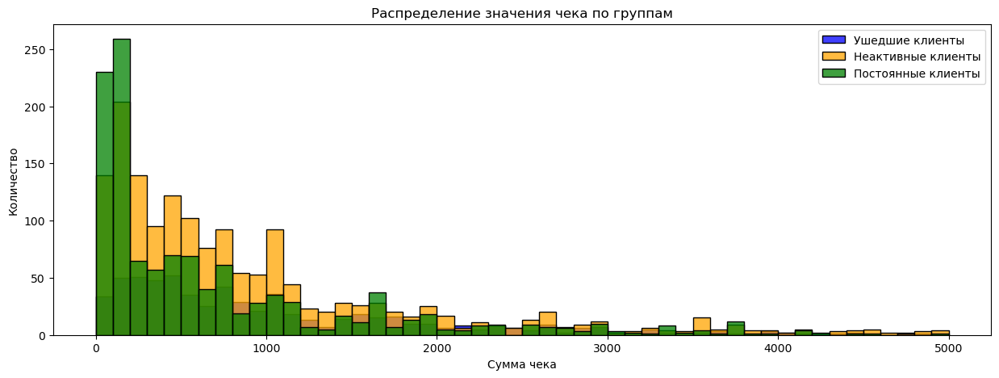

In [129]:
# гистограмма суммы чека по группам клиентов
fig, axs = plt.subplots(figsize=(15, 5))

sns.histplot(data=grouped_rfm1, x="total_revenue", bins=50, binrange=(0, 5000), color="blue")
sns.histplot(data=grouped_rfm2, x="total_revenue", bins=50, binrange=(0, 5000), color="orange")
sns.histplot(data=grouped_rfm3, x="total_revenue", bins=50, binrange=(0, 5000), color="green")
plt.xlabel("Сумма чека")
plt.ylabel("Количество")
plt.title("Распределение значения чека по группам")
plt.legend (('Ушедшие клиенты', 'Неактивные клиенты', 'Постоянные клиенты'))
plt.show()

На графике видно, что данные не распределены нормально. Дополнительно проверим с помощью теста Шапиро.

In [130]:
# проверяем, что данные в столбце 'revenue' нормально распределены
stat, p_value = shapiro(grouped_rfm1['total_revenue'])

print('Статистика теста:', stat)
print('P-значение:', p_value)

alpha = 0.05
if p_value > alpha:
    print('Данные распределены нормально')
else:
    print('Данные не распределены нормально')

Статистика теста: 0.3576857065978367
P-значение: 2.9899550768017912e-43
Данные не распределены нормально


In [131]:
# проверяем, что данные в столбце 'revenue' нормально распределены
stat, p_value = shapiro(grouped_rfm2['total_revenue'])

print('Статистика теста:', stat)
print('P-значение:', p_value)

alpha = 0.05
if p_value > alpha:
    print('Данные распределены нормально')
else:
    print('Данные не распределены нормально')

Статистика теста: 0.44868241102446027
P-значение: 2.781784222590964e-57
Данные не распределены нормально


In [132]:
# проверяем, что данные в столбце 'revenue' нормально распределены
stat, p_value = shapiro(grouped_rfm3['total_revenue'])

print('Статистика теста:', stat)
print('P-значение:', p_value)

alpha = 0.05
if p_value > alpha:
    print('Данные распределены нормально')
else:
    print('Данные не распределены нормально')

Статистика теста: 0.6304055083870154
P-значение: 4.300103512326565e-45
Данные не распределены нормально


In [133]:
# проверка гипотезы для групп rfm1 и rfm2
alpha = 0.05

results4 = stats.mannwhitneyu(grouped_rfm1['total_revenue'], grouped_rfm2['total_revenue'])[1]

print(round(results4, 10))

if results4 < alpha:
    print('Отвергаем нулевую гипотезу: разница статистически значима')
else:
    print('Не получилось отвергнуть нулевую гипотезу, вывод о различии сделать нельзя')

8.571e-07
Отвергаем нулевую гипотезу: разница статистически значима


In [134]:
# проверка гипотезы для групп rfm1 и rfm3
alpha = 0.05

results5 = stats.mannwhitneyu(grouped_rfm1['total_revenue'], grouped_rfm3['total_revenue'])[1]

print(round(results5, 30))

if results5 < alpha:
    print('Отвергаем нулевую гипотезу: разница статистически значима')
else:
    print('Не получилось отвергнуть нулевую гипотезу, вывод о различии сделать нельзя')

1.2300000000000002e-28
Отвергаем нулевую гипотезу: разница статистически значима


In [135]:
# проверка гипотезы для групп rfm2 и rfm3
alpha = 0.05

results6 = stats.mannwhitneyu(grouped_rfm2['total_revenue'], grouped_rfm3['total_revenue'])[1]

print(round(results6, 20))

if results6 < alpha:
    print('Отвергаем нулевую гипотезу: разница статистически значима')
else:
    print('Не получилось отвергнуть нулевую гипотезу, вывод о различии сделать нельзя')

6.4e-19
Отвергаем нулевую гипотезу: разница статистически значима


In [136]:
print("FWER: " + str(multipletests(sorted([results1, results2, results3, results4, results5, results6]), alpha=0.05, 
                     method='holm', is_sorted = True))) 

FWER: (array([ True,  True,  True,  True,  True,  True]), array([1.63656140e-222, 6.94575154e-210, 4.93992541e-028, 1.91360198e-018,
       1.53377944e-014, 8.57130005e-007]), 0.008512444610847103, 0.008333333333333333)


Поправка Холма не отвергнула результаты наших гипотез.

Вывод: для всех пар групп не удалось подтвердить нулевую гипотезу. Разница между группами в среднем размере чека статистически значима.

<a id="vivod"></a>
## Заключение

В результате анализа данных о заказах интернет-магазина "Пока все еще тут!" была проведена следующая работа:

1. Предобработка данных
 - для удобства работы с данными были изменены типы данных в некоторых столбцах;
 - устранены явные и неявные дубликаты;
 - проверка на аномалии.
 
2. Сегментация данных
 - Товары разделены на 4 категории: 
     * 'Искусственные цветы, декор, подарки'; 
     * 'Растения и рассада';
     * 'Товары для дома'; 
     * 'Товары для кухни'.
     
 - Покупатели разделены на 3 группы: 
     * Ушедшие клиенты - 602 покупателей; 
     * Неактивные клиенты - 1206 покупателей; 
     * Постоянные клиенты - 609 покупателей.

3. Исследовательский анализ данных
 - Распределение заказов по категориям интернет-магазина "Пока все еще тут!" следующее:
     - Расстения и рассада - 42,2%;
     - Товары для дома - 41,2%; 
     - Товары для кухни - 10,1%;
     - Искусственные цветы, декор, подарки - 6,57%.

Средний чек для групп покупателей следующий:
 - Ушедшие клиента - 1493 руб.;
 - Неактивные клиенты - 1093 рублей;
 - Постоянные клиенты - 862 рубля.

Самую высокую кумулятивную выручку за все время показили категории: Товары для дома и Растения и рассада.
Динамика общей выручки постепенно снижается за весь исследуемый период.

Анализ сезонности продаж в зависимости от сегмента покупателей:
1. Рекомендованные топ-категории для таргетной рекламной рассылки группе "Ушедшие клиенты":
 - Октябрь: Товары для дома, Растения и рассада, Товары для кухни;
 - Ноябрь: Товары для дома, Товары для кухни, Сумки и тележки;
 - Декабрь: Сумки и тележки, Товары для дома, Растения и рассада;
 - Январь: Растения и рассада, Товары для дома, Товары для кухни;
 - Февраль: Товары для дома, Товары для кухни, Растения и рассада.
2. Рекомендованные топ-категории для таргетной рекламной рассылки группе "Неактивные клиенты":
 - Октябрь: Товары для дома, Сумки и тележки, Растения и рассада;
 - Ноябрь: Сумки и тележки, Товары для дома, Растения и рассада;
 - Декабрь: Товары для дома, Растения и рассада; Сумки и тележки;
 - Январь: Провал продаж по всем категориям - можно не тратить деньги на рассылки;
 - Февраль-Июнь: Растения и рассада, Товары для дома, Сумки и тележки;
 - Июль: Товары для дома, Растения и рассада; Сумки и тележки;
 - Август: Товары для дома, Растения и рассада; Сумки и тележки;
 - Сентябрь: Товары для дома, Растения и рассада; Товары для кухни;
 - Октябрь: Товары для дома, Растения и рассада; Сумки и тележки;
 - Ноябрь: Товары для дома, Сумки и тележки, Растения и рассада.
3. Рекомендованные топ-категории для таргетной рекламной рассылки группе "Постоянные клиенты":
 - Декабрь: Сумки и тележки, Товары для дома, Растения и рассада;
 - Январь: Товары для дома, Растения и рассада;
 - Февраль: Товары для дома, Сумки и тележки, Растения и рассада;
 - Март-Май: Сумки и тележки, Товары для дома, Растения и рассада;
 - Июнь: Растения и рассада, Сумки и тележки, Товары для дома;
 - Июль: Товары для дома, Растения и рассада; Сумки и тележки;
 - Август: Сумки и тележки, Товары для дома, Растения и рассада;
 - Сентябрь: Сумки и тележки, Товары для дома, Растения и рассада;
 - Октябрь: Товары для дома, Сумки и тележки; Товары для кухни;
 - Ноябрь: Товары для дома, Растения и рассада, Товары для кухни;
 - Декабрь: Товары для дома, Сумки и тележки, Растения и рассада;
 - Январь: Товары для дома, Растения и рассада, Сумки и тележки.

Проверены гипотезы о среднем количестве и среднем чеке 3-х выявленных групп. Нулевые гипотезы не подтвердились. Разница статистически значима.